In [ ]:
# Updated imports for LSTM-TD3
import torch
import torch.nn as nn
import numpy as np
from copy import deepcopy
import pickle
import os
import os.path as osp
from datetime import datetime, timezone, timedelta
import matplotlib.pyplot as plt
import matplotlib as mpl

# Import LSTM-TD3 components
from lstm_td3.lstm_td3_main import MLPActorCritic

def load_lstm_td3_model(model_path, obs_dim=1001, act_dim=1, act_limit=np.pi/4, device='cpu'):
    """
    Load trained LSTM-TD3 model from checkpoint
    """
    # Initialize the actor-critic with same architecture as training
    ac = MLPActorCritic(
        obs_dim=obs_dim, 
        act_dim=act_dim, 
        act_limit=act_limit,
        # Use same architecture as in training - adjust these if different
        critic_mem_pre_lstm_hid_sizes=(128,),
        critic_mem_lstm_hid_sizes=(128,),
        critic_mem_after_lstm_hid_size=(),
        critic_cur_feature_hid_sizes=(128, 128),
        critic_post_comb_hid_sizes=(128,),
        critic_hist_with_past_act=True,
        actor_mem_pre_lstm_hid_sizes=(128,),
        actor_mem_lstm_hid_sizes=(128,),
        actor_mem_after_lstm_hid_size=(),
        actor_cur_feature_hid_sizes=(128, 128),
        actor_post_comb_hid_sizes=(128,),
        actor_hist_with_past_act=True
    )
    
    # Load the model state dict
    if model_path.endswith('best-model.pt'):
        checkpoint = torch.load(model_path, map_location=device)
        ac.load_state_dict(checkpoint['ac_state_dict'])
    else:
        # Handle other checkpoint formats if needed
        checkpoint = torch.load(model_path, map_location=device)
        ac.load_state_dict(checkpoint['ac_state_dict'])
    
    ac.to(device)
    ac.eval()  # Set to evaluation mode
    
    return ac

# Initialize device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Load the LSTM-TD3 model (replace with your actual model path)
model_path = '/afs/cern.ch/work/a/apastina/DatasetGen/datasetgenerator/lstm_td3_beam_logs/pyt_save/best-model.pt'
model = load_lstm_td3_model(model_path, device=device)


In [ ]:
class HistoryBuffer:
    """Buffer to store observation and action history for LSTM-TD3"""
    def __init__(self, max_hist_len=5, obs_dim=1001, act_dim=1):
        self.max_hist_len = max_hist_len
        self.obs_dim = obs_dim
        self.act_dim = act_dim
        self.reset()
    
    def reset(self):
        """Reset the history buffer"""
        self.obs_buffer = np.zeros((self.max_hist_len, self.obs_dim))
        self.act_buffer = np.zeros((self.max_hist_len, self.act_dim))
        self.buffer_len = 0
    
    def add_transition(self, obs, action):
        """Add a new observation-action pair to the buffer"""
        if self.buffer_len == self.max_hist_len:
            # Shift buffer left and add new entry at the end
            self.obs_buffer[:-1] = self.obs_buffer[1:]
            self.act_buffer[:-1] = self.act_buffer[1:]
            self.obs_buffer[-1] = obs
            self.act_buffer[-1] = action
        else:
            # Add to buffer
            self.obs_buffer[self.buffer_len] = obs
            self.act_buffer[self.buffer_len] = action
            self.buffer_len += 1
    
    def get_history_tensors(self, device):
        """Get history as tensors for the model"""
        # For LSTM-TD3, we need to handle the case where buffer_len might be 0
        if self.buffer_len == 0:
            # Return empty history
            hist_obs = torch.zeros(1, 1, self.obs_dim, device=device)
            hist_act = torch.zeros(1, 1, self.act_dim, device=device)
            hist_len = torch.tensor([0], device=device, dtype=torch.float32)
        else:
            # Return actual history
            hist_obs = torch.tensor(self.obs_buffer[:self.buffer_len], 
                                  device=device, dtype=torch.float32).unsqueeze(0)
            hist_act = torch.tensor(self.act_buffer[:self.buffer_len], 
                                  device=device, dtype=torch.float32).unsqueeze(0)
            hist_len = torch.tensor([self.buffer_len], device=device, dtype=torch.float32)
            
        return hist_obs, hist_act, hist_len

def phase_wrap(phase):
    """Wrap phase to [-π, π]"""
    return ((phase + np.pi) % (2 * np.pi)) - np.pi

def lstm_td3_batch_inference(model, profiles, phi_s_values, history_buffer, device):
    """
    Perform batch inference with LSTM-TD3 model using history
    
    Args:
        model: LSTM-TD3 actor-critic model
        profiles: Array of beam profiles [n_profiles, n_points]
        phi_s_values: Array of synchronous phase values [n_profiles]
        history_buffer: HistoryBuffer instance
        device: torch device
        
    Returns:
        corrections: Array of phase corrections [n_profiles]
    """
    n_profiles = len(profiles)
    corrections = np.zeros(n_profiles)
    
    with torch.no_grad():
        for i in range(n_profiles):
            # Prepare current observation
            profile_tensor = torch.tensor(profiles[i], dtype=torch.float32, device=device)
            phi_s_tensor = torch.tensor([phi_s_values[i]], dtype=torch.float32, device=device)
            current_obs = torch.cat([profile_tensor, phi_s_tensor]).unsqueeze(0)  # [1, 1001]
            
            # Get history tensors
            hist_obs, hist_act, hist_len = history_buffer.get_history_tensors(device)
            
            # Get action from actor
            action_tensor, _ = model.pi(current_obs, hist_obs, hist_act, hist_len)
            action = action_tensor.cpu().numpy()[0, 0]  # Extract scalar action
            corrections[i] = action
            
            # Add to history buffer for next iteration
            history_buffer.add_transition(current_obs.cpu().numpy()[0], np.array([action]))
    
    return corrections


In [ ]:
def optimize_cycle_lstm_td3(phase_sol, n_calls_max, model, client, sys_interface, bursts, 
                           burst_dict, phis_interp, max_hist_len=5, device='cpu'):
    """
    Modified optimize_cycle function for LSTM-TD3 with history buffers
    
    Args:
        phase_sol: Initial phase solution (t_vals, phase_sol_val)
        n_calls_max: Maximum number of optimization iterations
        model: LSTM-TD3 actor-critic model
        client: Control system client
        sys_interface: System interface for data acquisition
        bursts: Burst information
        burst_dict: Burst dictionary
        phis_interp: Interpolated phi_s values
        max_hist_len: Maximum history length for LSTM
        device: torch device
    
    Returns:
        set_time: Time array
        set_phase: Final phase array
        corrections_list: List of corrections for each iteration
    """
    result = None
    specs = {"args": locals(), "function": "base_minimize"}
    t_vals, phase_sol_val = phase_sol[0], phase_sol[1]

    init_set_phase = np.hstack((np.array([0.]), phase_sol_val))
    set_time = np.hstack((np.array([0.]), t_vals))
    
    # Set initial phase
    time_response = client.set(f'BA{ring}.FGPRFH2/Settings', context=user_context, value = 
                               {'amplitudes': pyda.data.DiscreteFunction(set_time, init_set_phase)})

    # Prepare phi_s values (normalize by π as expected by the model)
    phi_s = np.array(phis_interp) / np.pi
    
    # Initialize history buffer for LSTM-TD3
    history_buffer = HistoryBuffer(max_hist_len=max_hist_len, obs_dim=1001, act_dim=1)
    
    phi_s_constant = np.where(np.abs(np.diff(init_set_phase)) < 1e-6)[0]
    first_non_imp_ind = phi_s_constant[0] - 1 if len(phi_s_constant) > 0 else len(init_set_phase)
    prev_cycle_stamp = None
    current_phi = phase_sol_val.copy()
    corrections_list = []
    
    print(f"Starting optimization with LSTM-TD3 (max_hist_len={max_hist_len})")
    print(f"Using device: {device}")
    
    for n in range(n_calls_max):
        print(f"\\n=== Optimization Iteration {n+1}/{n_calls_max} ===")
        
        # Data Acquisition Sequence
        print('Acquiring data...')
        profiles, acq_time, _, _ = get_acq_waiting_cnn(sys_interface, prev_cycle_stamp)
        print('Averaging profiles on their intervals...')
        avr_profiles, avr_times = average_profiles_all_bursts(profiles, acq_time, t_vals, burst_dict, bursts)
        print('Re-interpolating data to RF phase...')
        final_data = reinterpolate_profile(avr_profiles, avr_times, frev_interp, n_points=1000)
        
        # Ensure final_data is properly shaped and normalized
        final_data = np.array(final_data)
        if final_data.ndim == 1:
            final_data = final_data.reshape(1, -1)
        
        # Plotting Sequence
        norm = mpl.colors.Normalize(vmin=avr_times.min(), vmax=avr_times.max())
        cmap = plt.cm.viridis
        fig, ax = plt.subplots(1, figsize=(10, 6))
        for i, entry in enumerate(final_data):
            color_i = cmap(norm(avr_times[i]))
            ax.plot(entry, color=color_i)
        sm = plt.cm.ScalarMappable(cmap=cmap)
        sm.set_clim(avr_times.min(), avr_times.max())
        cbar = fig.colorbar(sm, ax=ax, orientation='vertical')
        ax.set_xlabel('RF Phase [rad]')
        ax.set_ylabel('Normalized Intensity [-]')
        cbar.set_label('C-time [ms]')
        ax.set_title(f'Beam Profiles - Iteration {n+1}')
        plt.tight_layout()
        plt.show()

        # Waterfall plot
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111)
        p = ax.pcolormesh(np.linspace(0, 1000, 1000), acq_time, profiles, 
                         cmap='viridis', linewidth=0, antialiased=False)
        plt.ylabel('C-Time [ms]')
        plt.xlabel('Time [ns]')
        ax.set_title(f'Waterfall Plot - Correction Number {n+1}')
        plt.colorbar(p)
        plt.savefig(f'Waterfall_{n}_LSTM_TD3.png', dpi=150, bbox_inches='tight')
        plt.show()
        
        # LSTM-TD3 Inference Sequence
        print('Performing LSTM-TD3 inference with history...')
        
        # Ensure phi_s values match the number of profiles
        phi_s_batch = phi_s[:len(final_data)] if len(phi_s) >= len(final_data) else np.tile(phi_s, (len(final_data) // len(phi_s) + 1))[:len(final_data)]
        
        # Perform batch inference with history
        corrections = lstm_td3_batch_inference(
            model=model,
            profiles=final_data,
            phi_s_values=phi_s_batch,
            history_buffer=history_buffer,
            device=device
        )
        
        # Convert corrections from radians to degrees for display/logging
        corrections_deg = corrections * 180 / np.pi
        corrections_list.append(corrections_deg.copy())
        
        print(f"Applied corrections (degrees): {corrections_deg}")
        print(f"Max correction magnitude: {np.max(np.abs(corrections_deg)):.2f}°")
        
        # Update current phase with corrections (keeping in radians for phase_wrap)
        current_phi = phase_wrap(current_phi + corrections)
        
        # Prepare phase setting
        set_phase = np.hstack((np.array([0.]), current_phi))
        
        # Apply constant phase for non-improving regions
        if first_non_imp_ind < len(set_phase):
            set_phase[first_non_imp_ind:] = set_phase[first_non_imp_ind-1]
        
        # Convert current_phi to degrees for plotting
        current_phi_deg = current_phi * 180 / np.pi
        set_phase_deg = set_phase * 180 / np.pi
        
        print('Applying the following phase program:')
        plt.figure(figsize=(12, 6))
        plt.plot(set_time, set_phase_deg, 'b.-', label='LSTM-TD3 Phase', linewidth=2, markersize=6)
        if 'v2p_times' in locals() and 'v2p_val' in locals():
            plt.plot(v2p_times, v2p_val, 'r--', label='Manual Set Phase', alpha=0.7)
        plt.xlabel('C-time [ms]')
        plt.ylabel(r'Machine $\\Phi_2$ [degrees]')
        plt.title(f'Phase Program - Iteration {n+1}')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        
        # Set the new phase program
        v2p = client.set(f'BA{ring}.FGPRFH2/Settings', context=user_context, value = 
                         {'amplitudes': pyda.data.DiscreteFunction(set_time, set_phase)})
        
        # Set timestamp for next acquisition
        prev_cycle_stamp = datetime.now(timezone.utc) + timedelta(milliseconds=1200)
        
        # Final acquisition and plotting for last iteration
        if n == n_calls_max - 1:
            print("Final data acquisition...")
            profiles, acq_time, _, _ = get_acq_waiting_cnn(sys_interface, prev_cycle_stamp)
            avr_profiles, avr_times = average_profiles_all_bursts(profiles, acq_time, t_vals, burst_dict, bursts)
            final_data_final = reinterpolate_profile(avr_profiles, avr_times, frev_interp, n_points=1000)
            
            # Final plotting
            norm = mpl.colors.Normalize(vmin=avr_times.min(), vmax=avr_times.max())
            cmap = plt.cm.viridis
            fig, ax = plt.subplots(1, figsize=(10, 6))
            for i, entry in enumerate(final_data_final):
                color_i = cmap(norm(avr_times[i]))
                ax.plot(entry, color=color_i)
            sm = plt.cm.ScalarMappable(cmap=cmap)
            sm.set_clim(avr_times.min(), avr_times.max())
            cbar = fig.colorbar(sm, ax=ax, orientation='vertical')
            ax.set_xlabel('RF Phase [rad]')
            ax.set_ylabel('Normalized Intensity [-]')
            cbar.set_label('C-time [ms]')
            ax.set_title('Final Beam Profiles After Optimization')
            plt.tight_layout()
            plt.show()
        
        # Convergence check (convert to degrees for threshold)
        max_correction_deg = np.max(np.abs(corrections_deg))
        convergence_threshold_deg = 0.5  # degrees - adjust as needed
        
        if max_correction_deg <= convergence_threshold_deg:
            print(f'Converged at iteration {n+1} (max correction: {max_correction_deg:.3f}°)')
            break
        else:
            print(f'Continuing... (max correction: {max_correction_deg:.3f}° > {convergence_threshold_deg}°)')
    
    # Print optimization summary
    print(f"\\n=== Optimization Complete ===")
    print(f"Total iterations: {len(corrections_list)}")
    print(f"History buffer final length: {history_buffer.buffer_len}")
    
    return set_time, set_phase, corrections_list, history_buffer


In [ ]:
# Usage Example for LSTM-TD3 Optimization

# Replace the original optimize_cycle call with this:
# set_time, set_phase, corrections_list = optimize_cycle_lstm_td3(
#     phase_sol=(t_vals, phase_sol_val),
#     n_calls_max=10,  # Adjust as needed
#     model=model,
#     client=client,
#     sys_interface=sys_interface,
#     bursts=bursts,
#     burst_dict=burst_dict,
#     phis_interp=phis_interp,
#     max_hist_len=5,  # History length for LSTM (same as training)
#     device=device
# )

# Analysis functions for LSTM-TD3 results
def analyze_lstm_td3_results(corrections_list, history_buffer):
    """
    Analyze the results from LSTM-TD3 optimization
    
    Args:
        corrections_list: List of corrections from each iteration
        history_buffer: Final state of the history buffer
    """
    print("\\n=== LSTM-TD3 Optimization Analysis ===")
    print(f"Number of iterations: {len(corrections_list)}")
    print(f"Final history buffer length: {history_buffer.buffer_len}")
    
    # Plot correction evolution
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))
    
    # Corrections over iterations
    for i, corrections in enumerate(corrections_list):
        ax1.plot(corrections, label=f'Iteration {i+1}', marker='o', markersize=4)
    ax1.set_xlabel('Profile Index')
    ax1.set_ylabel('Correction [degrees]')
    ax1.set_title('Phase Corrections Evolution')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Maximum correction magnitude over iterations
    max_corrections = [np.max(np.abs(corr)) for corr in corrections_list]
    ax2.plot(range(1, len(max_corrections)+1), max_corrections, 'ro-', linewidth=2, markersize=8)
    ax2.set_xlabel('Iteration')
    ax2.set_ylabel('Max |Correction| [degrees]')
    ax2.set_title('Convergence Progress')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"\\nFinal max correction: {max_corrections[-1]:.3f}°")
    print(f"Average correction magnitude in last iteration: {np.mean(np.abs(corrections_list[-1])):.3f}°")
    print(f"Std dev of corrections in last iteration: {np.std(corrections_list[-1]):.3f}°")

def visualize_history_buffer(history_buffer, device):
    """
    Visualize the contents of the history buffer
    
    Args:
        history_buffer: HistoryBuffer instance
        device: torch device
    """
    if history_buffer.buffer_len == 0:
        print("History buffer is empty")
        return
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    # Plot observation history (first few dimensions)
    obs_history = history_buffer.obs_buffer[:history_buffer.buffer_len]
    
    # Plot some representative features from the beam profiles
    profile_samples = obs_history[:, :1000]  # First 1000 dims are the profile
    phi_s_history = obs_history[:, 1000]     # Last dim is phi_s
    
    for i in range(min(5, history_buffer.buffer_len)):  # Show up to 5 profiles
        ax1.plot(profile_samples[i], label=f'Step {i+1}', alpha=0.7)
    ax1.set_xlabel('Profile Index')
    ax1.set_ylabel('Normalized Intensity')
    ax1.set_title('Beam Profile History in Buffer')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot action history
    act_history = history_buffer.act_buffer[:history_buffer.buffer_len, 0]
    ax2.plot(range(1, history_buffer.buffer_len + 1), act_history * 180/np.pi, 'ro-', linewidth=2, markersize=8)
    ax2.set_xlabel('History Step')
    ax2.set_ylabel('Action [degrees]')
    ax2.set_title('Action History in Buffer')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print(f"\\nHistory Buffer Summary:")
    print(f"Buffer length: {history_buffer.buffer_len}/{history_buffer.max_hist_len}")
    print(f"Last phi_s: {phi_s_history[-1]:.3f}")
    print(f"Last action: {act_history[-1] * 180/np.pi:.3f}°")

# Example of how to use the analysis functions after optimization:
# analyze_lstm_td3_results(corrections_list, history_buffer)
# visualize_history_buffer(history_buffer, device)

print("✓ LSTM-TD3 optimization functions loaded successfully!")
print("✓ Ready to use optimize_cycle_lstm_td3() instead of optimize_cycle()")
print("✓ Don't forget to update your function call to use the new parameters")


In [ ]:
# Debug and Testing Utilities for LSTM-TD3

def test_lstm_td3_model(model, device, n_test_profiles=5):
    """
    Test the LSTM-TD3 model with synthetic data to ensure it's working correctly
    
    Args:
        model: LSTM-TD3 actor-critic model
        device: torch device
        n_test_profiles: Number of test profiles to generate
    """
    print("\\n=== Testing LSTM-TD3 Model ===")
    
    # Create synthetic test data
    test_profiles = np.random.rand(n_test_profiles, 1000)  # Random profiles
    test_phi_s = np.random.uniform(-0.5, 0.5, n_test_profiles)  # Random phi_s values
    
    # Initialize history buffer
    test_history_buffer = HistoryBuffer(max_hist_len=5, obs_dim=1001, act_dim=1)
    
    print(f"Testing with {n_test_profiles} synthetic profiles...")
    
    try:
        # Test the inference function
        corrections = lstm_td3_batch_inference(
            model=model,
            profiles=test_profiles,
            phi_s_values=test_phi_s,
            history_buffer=test_history_buffer,
            device=device
        )
        
        print("✓ Model inference successful!")
        print(f"  - Input profiles shape: {test_profiles.shape}")
        print(f"  - Input phi_s shape: {test_phi_s.shape}")
        print(f"  - Output corrections shape: {corrections.shape}")
        print(f"  - Corrections range: [{np.min(corrections):.3f}, {np.max(corrections):.3f}] rad")
        print(f"  - Corrections range: [{np.min(corrections)*180/np.pi:.1f}, {np.max(corrections)*180/np.pi:.1f}] deg")
        print(f"  - Final history buffer length: {test_history_buffer.buffer_len}")
        
        # Test model direct call
        with torch.no_grad():
            test_obs = torch.cat([
                torch.tensor(test_profiles[0], dtype=torch.float32, device=device),
                torch.tensor([test_phi_s[0]], dtype=torch.float32, device=device)
            ]).unsqueeze(0)
            
            hist_obs = torch.zeros(1, 1, 1001, device=device)
            hist_act = torch.zeros(1, 1, 1, device=device)
            hist_len = torch.tensor([0], device=device, dtype=torch.float32)
            
            action, memory = model.pi(test_obs, hist_obs, hist_act, hist_len)
            print(f"✓ Direct model call successful!")
            print(f"  - Action: {action.cpu().numpy()[0, 0]:.3f} rad ({action.cpu().numpy()[0, 0]*180/np.pi:.1f} deg)")
            print(f"  - Memory shape: {memory.shape}")
        
        return True
        
    except Exception as e:
        print(f"✗ Model test failed: {e}")
        import traceback
        traceback.print_exc()
        return False

def validate_model_architecture(model):
    """
    Validate that the model architecture matches expectations
    
    Args:
        model: LSTM-TD3 actor-critic model
    """
    print("\\n=== Model Architecture Validation ===")
    
    try:
        # Check that model has expected components
        assert hasattr(model, 'pi'), "Model missing actor (pi)"
        assert hasattr(model, 'q1'), "Model missing first critic (q1)"
        assert hasattr(model, 'q2'), "Model missing second critic (q2)"
        print("✓ Model has required components (pi, q1, q2)")
        
        # Check observation and action dimensions
        obs_dim = model.pi.obs_dim
        act_dim = model.pi.act_dim
        print(f"✓ Model dimensions: obs_dim={obs_dim}, act_dim={act_dim}")
        
        # Verify expected dimensions
        assert obs_dim == 1001, f"Expected obs_dim=1001, got {obs_dim}"
        assert act_dim == 1, f"Expected act_dim=1, got {act_dim}"
        print("✓ Dimensions match expected values")
        
        # Check action limits
        act_limit = model.pi.act_limit
        print(f"✓ Action limit: {act_limit:.3f} rad ({act_limit*180/np.pi:.1f} deg)")
        
        return True
        
    except Exception as e:
        print(f"✗ Architecture validation failed: {e}")
        return False

def check_model_device(model, expected_device):
    """
    Check if model is on the expected device
    
    Args:
        model: LSTM-TD3 model
        expected_device: Expected torch device
    """
    print(f"\\n=== Device Check ===")
    
    try:
        # Get device of first parameter
        model_device = next(model.parameters()).device
        print(f"Model device: {model_device}")
        print(f"Expected device: {expected_device}")
        
        if str(model_device) == str(expected_device):
            print("✓ Model is on correct device")
            return True
        else:
            print("✗ Model device mismatch")
            print("  Use model.to(device) to move model to correct device")
            return False
            
    except Exception as e:
        print(f"✗ Device check failed: {e}")
        return False

# Run all tests
print("="*60)
print("LSTM-TD3 MODEL VALIDATION")
print("="*60)

# Validate architecture
arch_valid = validate_model_architecture(model)

# Check device
device_valid = check_model_device(model, device)

# Test functionality
if arch_valid and device_valid:
    func_valid = test_lstm_td3_model(model, device)
    
    if func_valid:
        print("\\n" + "="*60)
        print("🎉 ALL TESTS PASSED! Model is ready for optimization.")
        print("="*60)
    else:
        print("\\n" + "="*60)
        print("❌ FUNCTIONALITY TEST FAILED!")
        print("="*60)
else:
    print("\\n" + "="*60)
    print("❌ ARCHITECTURE OR DEVICE VALIDATION FAILED!")
    print("="*60)

print("\\n📝 IMPORTANT NOTES:")
print("1. Make sure your model path is correct")
print("2. Verify the model was trained with the same architecture parameters")
print("3. Check that max_hist_len matches your training configuration")
print("4. Ensure your beam profile data is normalized properly (0-1 range)")
print("5. Phi_s values should be normalized by π")


In [120]:
import numpy as np 
from scipy.interpolate import interp1d
from scipy.signal import find_peaks, savgol_filter, butter, lfilter,filtfilt
import logging
import os 
from copy import deepcopy
from scipy.constants import c, e, m_p
import matplotlib.pyplot as plt
import pyda 
import pyda_japc as pj
import matplotlib as mpl
from pybcwlbo.system.interface import *
import time 
import matplotlib as mpl

plt.style.use('fivethirtyeight')
# Make the backround white though of the figure and the axes
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white' 
plt.rcParams['savefig.facecolor'] = 'white'
# Make all the plots do this: plt.gca().set_xlim(left=0)
plt.rcParams['axes.autolimit_mode'] = 'data'
plt.rcParams['axes.xmargin'] = 0.01
plt.rcParams['font.size'] = 16


In [2]:
def range_comp(v1, delta_E, cycle_time, tolerance):
    '''
    Computes the points in time at which the 
    phase program is computed at such that points in time
    in which the stable phase (first order approximation)
    has a discontinuity or if its derivative is discontinuous
    (the rest is done by interpolation)
    '''
    
    stable_phase = np.arcsin(np.array(delta_E) / v1[:-1]) # this is to correct for BLonD
    # NOTE: the sign is flipped to better aid the optimization algorithm and to better 
    # represent the phase fo the 2nd harmonic, not of the first one.

    plt.plot(cycle_time[:-1],stable_phase)
    plt.xlabel('Time since C-275 [ms]')
    plt.ylabel('SH Stable Phase') 
    plt.show()
    
    stable_phase_d = savgol_filter(stable_phase, 1000, 1) # this corresponds to 1ms sampling and linearization

    # NOTE:savgol_filter is by fer the best to remove digitization effects + noise
    # of course the parameters need to be revisited every time a new program 
    # is loaded 

    phase_diff = np.abs(np.gradient(stable_phase_d, cycle_time[:-1]))

    # apply a moving average to smooth the phase_diff
    phase_diff = moving_average(phase_diff, 1000)

    # Filter the phase_diff to remove the noise
    phase_diff = savgol_filter(phase_diff, 1000, 1)

    peaks, _ = find_peaks(phase_diff, height = tolerance)

    
    eliminate = np.where(np.diff(peaks)<=1000)[0]

    if len(eliminate) == 0:
        pass
    else:
        peaks = np.delete(peaks, eliminate)

    
    t_vals = cycle_time[peaks]

    for i in range(3):
        t_vals_merge_inds = np.where(np.diff(t_vals) < 10)[0]
        # Check how many clusters there are
        t_vals_merge_clusters = np.split(t_vals, t_vals_merge_inds)
        t_vals_merge = []
        for cluster in t_vals_merge_clusters:
            t_vals_merge.append(np.mean(cluster))
        t_vals = np.array(t_vals_merge)
        # Sort the t_vals
        t_vals = np.sort(t_vals)

    
    plt.plot(cycle_time[:-1],phase_diff)
    plt.xlabel('Time since C-275 [ms]')
    plt.ylabel('|-| of Time Derivative Derivative of SH Stable Phase') 
    for t in t_vals:
        plt.axvline(t, color='r', linestyle='--') 
    plt.show()
        
    return t_vals, stable_phase
        
def comp_sim_arr(v1, cycle_time, B, dt_opt,tolerance, return_phi_s0= True):
    """ This function computes the starting and ending turns which 
    define each optimization interval based on dt_opt (given in ms)
    and the total cycle time array (cycle_time).

    Parameters
    ----------
    cycle_time : list[n_turns+1]
        Array of cycle_time
    t_rev : list[n_turns+1] 
        Array of revolution periods in ms
    dt_opt : float
        Optimization interval in ms

    """
    total_sim_t = cycle_time[-1] - cycle_time[0]

    corr_cycle_time = np.array(cycle_time) - cycle_time[0]

    v_interp = np.interp(corr_cycle_time, v1[0]-v1[0][0], v1[1])

    delta_E = comp_delta_E(corr_cycle_time, B)
    
    t_valss , phi_s1 =  range_comp(v_interp, delta_E , corr_cycle_time, tolerance)

    phi_s1 = (corr_cycle_time[:-1],phi_s1)
    
    turn_vals = [np.where(corr_cycle_time <= t)[0][-1] for t in t_valss]
    sim_arr = []
    t_arr = []
    dummy = 1
    dummy_2 = 1
    t_count = 0 
    initial = 0 
    t_arr.append(0)


    while t_count < total_sim_t:
        if initial == 0:
            t_count += dt_opt
            turn = np.where(corr_cycle_time <= t_count)[0][-1]
            sim_arr.append([dummy,3000, dummy_2])
            initial = 1
            dummy_2 = turn
        elif initial == 1:
            dummy_t = np.copy(t_count)
            t_count += dt_opt
            turn = np.where(corr_cycle_time <= t_count)[0][-1]
            cond_check = np.array([check_turn<=turn and check_turn<=dummy_2 for check_turn in turn_vals])
            if any(cond_check):

                idx_s = np.where(cond_check == True)[0]

                
                amount = len(idx_s)
                for condition_hit in range(amount):
                    idx = idx_s[condition_hit]
                    sim_arr.append([sim_arr[-1][2],turn, turn_vals[0]])
                    dummy = turn_vals[0]
                    t_arr.append(corr_cycle_time[turn_vals[0]])
                    turn_vals.pop(0)
                
                sim_arr.append([sim_arr[-1][2],turn, dummy_2])
                t_arr.append(dummy_t)
                dummy = dummy_2
                initial = 2
                dummy_2 = turn
            else:
                sim_arr.append([dummy,turn, dummy_2])
                t_arr.append(dummy_t)
                dummy = dummy_2
                initial = 2
                dummy_2 = turn
        else:
            dummy_t = np.copy(t_count)
            t_count += dt_opt
            turn = np.where(corr_cycle_time <= t_count)[0][-1]
            cond_check = np.array([check_turn<=turn and check_turn<=dummy_2 for check_turn in turn_vals]) #Checks if we are in the range
            if any(cond_check):
                idx_s = np.where(cond_check == True)[0]
                
                amount = len(idx_s)
                db_counter = 0
                for condition_hit in range(amount):
                    idx = idx_s[condition_hit]
                    sim_arr.append([sim_arr[-1][2],turn, turn_vals[0]])
                    t_arr.append(corr_cycle_time[turn_vals[0]])
                    turn_vals.pop(0)
                    
                t_arr.append(dummy_t)
                sim_arr.append([sim_arr[-1][2],turn,dummy_2])
                dummy = sim_arr[-1][2]
                dummy_2 = turn
            else:
                sim_arr.append([dummy,turn, dummy_2])
                t_arr.append(dummy_t)
                dummy = dummy_2
                initial = 2
                dummy_2 = turn
        

    sim_arr = np.array(sim_arr)
    sim_arr[1:-1,1] = sim_arr[1:-1,2]
    t_arr = np.array(t_arr)
    if return_phi_s0:
        return sim_arr, t_arr, phi_s1

    else:
        return sim_arr, t_arr 

def moving_average(x,w):
    return np.convolve(x,np.ones(w),'same') / w



def comp_delta_E(cycle_time, B):
    """ This function computes delta_E, but note that B must be a (time, B_field)
    tuple and cycle_time must be a turn by turn cycle time.
    
    Parameters
    ----------
    cycle_time : list[n_turns+1]
        The turn by turn cycle time
    B : tuple(time, B_field)
        The B field in T
    """
    # Machine and RF parameters
    radius = 25 # [m]
    bend_radius = 8.239 # [m]
    gamma_transition = 4.4  # [1]
    C = 2 * np.pi * radius  # [m]

    # Derived parameters
    E_0 = m_p * c**2 / e    # [eV]
    
    sync_momentum = B[1]* 1e-4 * bend_radius *c  #eV
    total_E = np.sqrt(sync_momentum**2 + E_0**2)
    kin_energy = total_E - E_0

    # Interpolate the kinetic energy over the cycle_time
    kin_energy_interp = np.interp(cycle_time, B[0]-B[0][0], kin_energy)
    # Compute the delta_E
    delta_E = np.diff(kin_energy_interp)
    
    
    return delta_E




def avrage_frev(c_start, c_end,frev_interp):
    return (frev_interp(c_start)+ frev_interp(c_end))/2

def get_turn_array(c_start, c_end, frev_interp):
    t = c_start
    cycle_time = [c_start]
    t_rev = [1/frev_interp(c_start)]
    while t < (c_end+2) :
        f_i = frev_interp(t)
        t = t + 1/f_i * 1e3
        if t < (c_end): # We extend t_rev for 2 more ms given that the delay correction needs to correct considering the 1ms delay of the card
            cycle_time.append(t)
        t_rev.append(1/f_i)
    return cycle_time, t_rev





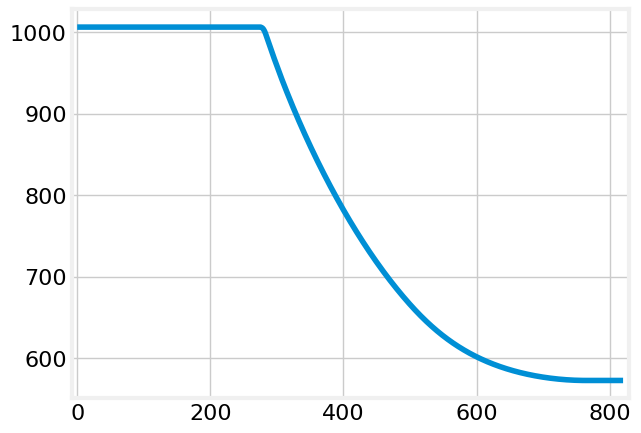

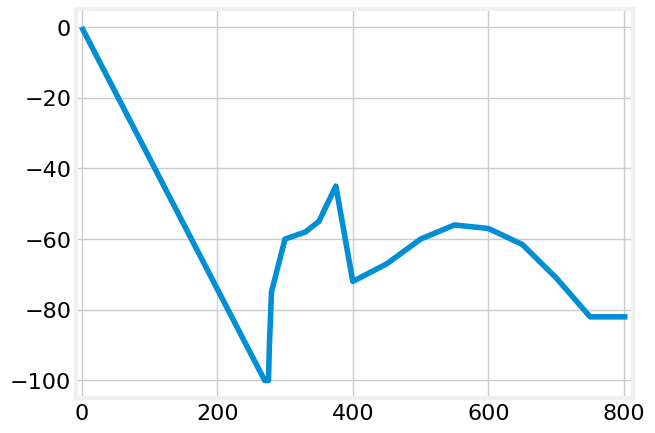

/nfs/cs-ccr-nfsop/nfs6/vol28/u1/psbop/SY_RF/Anibal/code/CNN/MD1


In [134]:
# Get the starting data
client_async = pyda.AsyncIOClient(provider=pj.JapcProvider())
client =  pyda.SimpleClient(provider = pj.JapcProvider())

user_context = 'PSB.USER.MD1'
logger = logging.getLogger(__name__)
logging.basicConfig(filename='test2.log', level=logging.INFO)
logger.info('Starting Acquisition of static parameters')
# Get the magnetic field, h1, h2 for all sectors
mag_field = client.get('BR3.BTGEN/InputDataB#functionB', context=user_context)
logger.info('Acquired: \n - magnetic field')
v1a = client.get('BA3.FGVRFH1/Settings#amplitudes', context=user_context)
logger.info('Acquired: \n - V1 Amplitudes')
v2a = client.get('BA3.FGVRFH2/Settings#amplitudes', context=user_context)
logger.info('Acquired: \n - V2 Amplitudes')

v2p = client.get('BA3.FGPRFH2/Settings#amplitudes', context=user_context)

f_revolution = client.get("BA3.FREQPROG-SD/Tuples#tuples", context=user_context)
f_revolution_time = client.get("BA3.FREQPROG-SD/SamplesFromTrigger#samplesTrain", context=user_context)

# Get the magnetic field
mag_times = mag_field.value.get('value').xs # in ms
mag_val = mag_field.value.get('value').ys # in Gauss

magnetic_field = np.array([mag_times, mag_val]) 


# Get the V1 amplitudes
v1 = v1a.value.get('value')[0] # in ms
v1_times = v1.xs # in ms 
v1_val = v1.ys # in volts

v1_amplitudes = np.array([v1_times, v1_val]) 


# Get the V2 amplitudes
v2aa = v2a.value.get('value')[0]# in ms
v2_times = v2aa.xs
v2_val = v2aa.ys # in volts
v2_amplitudes = np.array([v2_times, v2_val])


# Get the original phase
v2pa = v2p.value.get('value')[0]
v2p_times = v2pa.xs
v2p_val = v2pa.ys # degrees
v2p_amplitudes = np.array([v2p_times, v2p_val])


# # Get the revolution frequency
frev = f_revolution.value.get('value')[0]

frev_time = frev.xs
frev_val = frev.ys

frev_arr = np.array([frev_time,frev_val])

plt.plot(frev_time,1e9/frev_val)
plt.show()

plt.plot(v2p_times,v2p_val)
plt.show()

v2p_original = (v2p_times,v2p_val)
logger.info('Ending Acquisition of static parameters')


loc_dir = os.getcwd()

# Check if there is a folder for the context already
context_shorthand = user_context.split('.')[-1]
loc_dir += '/'+context_shorthand
os.makedirs(loc_dir, exist_ok=True)
print(loc_dir)
np.save(loc_dir+'/mag_field.npy', magnetic_field)
np.save(loc_dir+'/v1a.npy', v1_amplitudes)
np.save(loc_dir+'/v2a.npy', v2_amplitudes)
np.save(loc_dir+'/v2p.npy', v2p_amplitudes)

np.save(loc_dir+'/frev.npy', frev_arr)





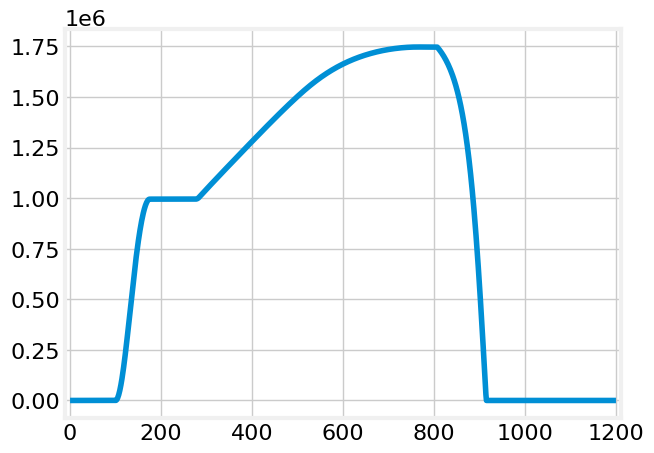

In [135]:
from scipy.constants import c, e, m_p

# Machine and RF parameters
radius = 25 # [m]
bend_radius = 8.239 # [m]
gamma_transition = 4.4  # [-]

b_interp = interp1d(mag_times,mag_val/1e4)

t_dummy = np.linspace(mag_times[0], mag_times[-1], 1000) 

frev = (c/radius) * np.sqrt(b_interp(t_dummy)**2 / (b_interp(t_dummy)**2  + ((m_p*c)/(e*bend_radius))**2)) /(2*np.pi)

frev_interp = interp1d(t_dummy,frev)
np.save(loc_dir+'/frev_interp.npy',frev_interp)

plt.plot(t_dummy,frev)
plt.show()


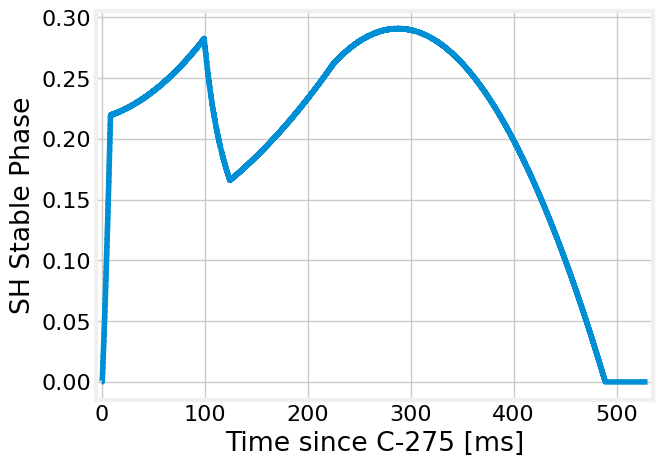

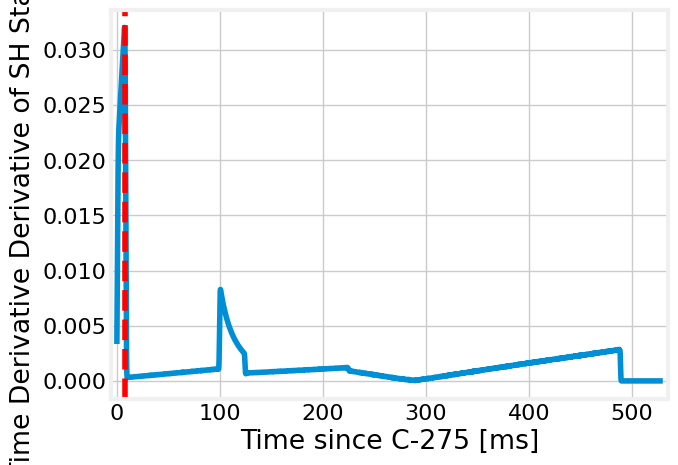

[275.0, 282.42618745161434, 290.0, 305.0, 320.0, 335.0, 350.0, 365.0, 380.0, 395.0, 410.0, 425.0, 440.0, 455.0, 470.0, 485.0, 500.0, 515.0, 530.0, 545.0, 560.0, 575.0, 590.0, 605.0, 620.0, 635.0, 650.0, 665.0, 680.0, 695.0, 710.0, 725.0, 740.0, 755.0, 770.0, 785.0, 800.0]


In [136]:
# Precompute all relevant arrays

######################################
# SET THE OPTIMIZATION INTERVAL LENGTH:
dt_opt = 15 #ms
# SET THE TOLERANCE
tolerance = 10/1000
######################################
cycle_time, t_rev = get_turn_array(275.,805.,frev_interp)



b_indi = np.where(mag_times>=275.)[0][0]
b_indf = np.where(mag_times<=805.)[0][-1]

v_indi = np.where(v1_times>=275.)[0][0]
v_indf = np.where(v1_times>=805.)[0][-1]

plt.plot()



B = (mag_times[b_indi:b_indf+1] - mag_times[b_indi] , mag_val[b_indi:b_indf+1])

V1 = (v1_times[v_indi:v_indf+1],v1_val[v_indi:v_indf+1])
sim_arr, t_vals, phi_s0 = comp_sim_arr(V1, cycle_time, B, dt_opt, tolerance, return_phi_s0 = True)

start_times = (np.array(t_vals) + 275.).tolist()

phi_s_interp = np.interp(start_times, phi_s0[0] +275., phi_s0[1])
print(start_times)
# Now we need to define each individual burst param for speed in the actual super-cycle


# [741274 797169 776208]
# [741274 793676 776208]


In [137]:
from datetime import datetime, timezone, timedelta
import bisect 
from scipy.interpolate import make_smoothing_spline


factor = 4 # sometimes it is necessary to increase this integer depending on the delays present in the system, but I cannot see where it is coming from

def roi_extract(filtered_profile, tol=0.7, return_bound=False):
    # gradient = filter_data(np.gradient(filtered_profile),fsamp, div)
    gradient = spline_smooth(np.gradient(filtered_profile))
    gradient_norm = np.where(gradient<=0,gradient,gradient/np.max(gradient))
    gradient_norm = np.where(gradient_norm>=0,gradient_norm,gradient/np.abs(np.min(gradient)))

    ind_i = np.where(gradient_norm>= tol)[0][0]
    ind_f = np.where(gradient_norm<= -tol)[0][-1]
    
    if return_bound:
        return filtered_profile[ind_i:ind_f+1], (ind_i ,ind_f), gradient_norm
    else: 
        return filtered_profile[ind_i:ind_f+1]
    
def find_best_bursts(cycle_times, desired_c_times):
    """
    Splits the cycle into 4 time-based bursts, each with up to 400 traces.
    Finds the optimal delta_turns for each burst to minimize alignment error.
    
    Args:
        cycle_times (List[float]): Cycle times for each turn (including start).
        desired_c_times (List[float]): Desired sampling times.
        
    Returns:
        List[dict]: List of burst configurations (start_turn, end_turn, delta_turns).
    """
    if not cycle_times or not desired_c_times:
        return []
    
    total_time = cycle_times[-1] - cycle_times[0]

    n_bursts = 4
    burst_time_points = np.logspace(np.log10(275) ,np.log10(cycle_times[-1]) , 5, endpoint=True)
    print(burst_time_points)
    burst_time_intervals = [(burst_time_points[i], burst_time_points[i+1]) for i in range(len(burst_time_points)-1)]

    bursts = []
    
    for burst_idx,(t_start, t_end) in enumerate(burst_time_intervals):
        # Find start and end turns for this time interval
        start_turn = bisect.bisect_right(cycle_times, t_start) - 1
        start_turn = max(0, start_turn)
        end_turn = bisect.bisect_left(cycle_times, t_end) - 1
        end_turn = min(end_turn, len(cycle_times) - 2)  # Ensure end_turn+1 exists
        
        if start_turn > end_turn:
            # Empty burst (no turns in interval)
            bursts.append({'start_turn': 0, 'end_turn': 0, 'delta_turns': 1})
            continue
        
        # Determine desired_c_times within this burst's time interval
        burst_desired = [t for t in desired_c_times if t_start <= t < t_end]
        if not burst_desired:
            # No desired times here; use minimal delta_turns
            delta = max(1, ((end_turn - start_turn) // 400) + 1)
            bursts.append({'start_turn': start_turn, 'end_turn': end_turn, 'delta_turns': delta})
            continue
        
        # Compute valid delta_turns range (ensure ≤400 traces)
        n_turns_burst = end_turn - start_turn
        delta_min = max(1, (n_turns_burst // 400) + 1)
        max_possible_delta = n_turns_burst
        best_delta = delta_min
        min_error = float('inf')
        
        for delta in range(delta_min, max_possible_delta + 1):
            # Generate acquired times for this delta
            acquired_indices = range(start_turn, end_turn + 1, delta)
            acquired_ctimes = [cycle_times[i] for i in acquired_indices]
            if len(acquired_ctimes) > 400:
                continue  # Skip deltas exceeding trace limit
            
            # Compute error for burst's desired_c_times
            total_error = 0
            for t in burst_desired:
                pos = bisect.bisect_left(acquired_ctimes, t)
                if pos == 0:
                    closest = acquired_ctimes[0]
                elif pos == len(acquired_ctimes):
                    closest = acquired_ctimes[-1]
                else:
                    before = acquired_ctimes[pos - 1]
                    after = acquired_ctimes[pos]
                    closest = before if (t - before) <= (after - t) else after
                total_error += abs(t - closest)
            
            if total_error < min_error or (total_error == min_error and delta > best_delta):
                min_error = total_error
                best_delta = delta
        
        bursts.append({'start_time': cycle_times[start_turn], 'end_time': cycle_times[end_turn], 'start_turn': start_turn, 'end_turn': end_turn, 'delta_turns': best_delta, 'burst_id': burst_idx+1})
    
    return bursts

def filter_data(Profile,fsamp,div = 80):
    
    
    b,a = butter(3,1e9 * fsamp/div, 'lowpass', fs=1e9 * fsamp)

    y = filtfilt(b, a, Profile)

    # This is necessary to eliminatte the artifacts near the end that appear because of noise
    amount_trim = 40
    y[:amount_trim] = y[amount_trim]
    y[-amount_trim:] = y[-amount_trim]
    
    # Plot the FFT of the signal
    return y

def spline_smooth(Profile):
    reference = Profile/np.max(Profile)
    xs = np.linspace(0,1,len(Profile),endpoint=True)
    spline = make_smoothing_spline(xs,reference)
    smoothed = spline(xs)
    
    return smoothed

def moving_avr(x,w):
    return np.convolve(x,np.ones(w),'same')/w
    

    
    
def comp_prof(ref_Profile):
    """NOTE
    Another idea is to divide by the total amount of particles, 
    and then take the cumulative 5% off of either side, such that 
    we only keep 95% or any other amount (could be 2 or 3 sigma to 
    represent the entire bunch)
    Currently it trims anything below 0.1% of the max
    """
    # Get the reference normalized profile shape in y direction
    norm_ref_profile = np.abs(ref_Profile) / np.max(ref_Profile)
    
    integrator = np.cumsum(norm_ref_profile)/np.sum(norm_ref_profile)
    idxi = np.where(integrator >= 0.0001)[0]

    idxf = np.where(integrator >= 0.9999)[0]

    
    norm_ref_profile = norm_ref_profile[idxi[0]:idxf[0]]

    norm_bunch_array = np.linspace(0,1,len(norm_ref_profile), endpoint=True)

    # Interpolate the profile
    norm_ref_profile = interp1d(norm_bunch_array, norm_ref_profile)

    return norm_ref_profile
    
    


def get_interval_delay(entry,t_rev,delta_turns, init_delay):
    """Gets the delay in ns for each trace taken during an optimization interval
    defined by `entry`, and also the number of traces.  
    
    Parameters
    ----------
    entry : list
        [start_turn, end_turn]
    t_rev : list[n_turns+1]
        Array of revolution periods in s
    delta_turns : int
        Number of turns between each trace
    init_delay : float
        Initial delay in ns
    """
    if isinstance(entry, dict):
        start_turn = entry['start_turn'] 
        end_turn = entry['end_turn'] 
    else: 
        start_turn = entry[0]
        end_turn  = entry[1]

        
    traces = int((end_turn - start_turn)//delta_turns)
    if traces>400:
        traces = 400
        delta_turns = int( np.floor((end_turn - start_turn) / traces))

    #This correction is here because acquisition is usually delayed by 1ms
    correction = int(0.001 // t_rev[start_turn])
    
        
    delays = [init_delay]
    for i in range(1,traces):
        delays.append( init_delay - factor*(t_rev[start_turn+correction] - t_rev[start_turn+i*delta_turns +correction])*1e9)
        

    delays = np.array(delays)

    return delays, traces, delta_turns


def comp_ns_sampling(c_start,frev_interp,init_delay, prev_ns_sampling, n_points=1000):
    """ Computes the sampling rate in ns for each trace based on the
    revolution frequency (frev_interp) to capture a bucket across
    the entire cycle. """
    if prev_ns_sampling == None:
        prev_ns_sampling = 1.0
        
    possible_ns_per_point = [1.0]
    ns_per_point = None
    # Compute the bucket length in ns
    f_i = frev_interp(c_start)
    n_points_min = 200
    bucket_length = 1e9 /f_i 

    ns_per_point_min = bucket_length/n_points
    
    max_samp = min(1.0,ns_per_point_min)*1.3
    for i in range(len(possible_ns_per_point)):
        if possible_ns_per_point[i] > max_samp:
            pass
        else:
            ns_per_point = possible_ns_per_point[i]
            break
    
    if ns_per_point == None:
        ns_per_point = possible_ns_per_point[0]
        # n_points = int(np.ceil(bucket_length/ns_per_point))
        # if n_points<n_points_min:
        #     n_points = n_points_min

    if ns_per_point == prev_ns_sampling:
        pass
    else:
        init_delay += n_points*(prev_ns_sampling - ns_per_point)/2
        
    return n_points, ns_per_point, init_delay


    
def create_all_burst_and_delays(bursts, t_rev, init_delay, frev_interp, prev_ns_sampling, tester = False):
    """This function will create a single burst for an entry (optimization interval) and delay dictionary
    entry: [turn_start, turn_end, turn_end]
    cycle_time: [n_turns] cycle time at each turn computed with the frev
    t_rev: [n_turns] revolution period at each turn computed with the frev
    init_delay: move this arround to capture the bucket you want
    """ 
    bursts_list = []
    for i,entry in enumerate(bursts):
        c_start = entry['start_time']  # This -1 is a correction because of the delayed acquisition by 1ms

        n_points, ns_sampling, init_delay = comp_ns_sampling(c_start, frev_interp, init_delay, prev_ns_sampling) # It comes from here, but this must be computed before
        prev_ns_sampling = ns_sampling
        delays , traces , delta_turns = get_interval_delay(entry,t_rev, entry['delta_turns'], init_delay)
        if tester: # The deltas between the traces of the acquisition timestamps should match with and without card delays
            delays = [0]*traces
        print('Burst: ', i+1)
        print('Initial delay: ', init_delay)
        print('Final delay: ', delays[-1])
        init_delay = delays[-1]
        if i == 0:
            delays_dict = {}
            delays_dict['groupId'] = []
            delays_dict['triggerDelayNs'] = []
            delays_dict['numberOfSamples'] = []
            delays_dict['sampleIntervalNs'] = []
            delays_dict['burstId'] = []

        delays_dict['groupId'].extend([0]*traces)
        delays_dict['triggerDelayNs'].extend(delays)
        delays_dict['numberOfSamples'].extend([n_points]*traces)
        delays_dict['sampleIntervalNs'].extend([ns_sampling] * traces)
        delays_dict['burstId'].extend([i+1]*traces)
        # delays_dict['groupId'] = np.array([0] * traces)
        # delays_dict['triggerDelayNs'] = np.array(delays)
        # delays_dict['numberOfSamples'] = np.array([n_points] * traces)
        # delays_dict['sampleIntervalNs'] = np.array([ns_sampling] * traces)
        # delays_dict['burstId'] = np.array([i+1] * traces)
        bursts_list.append([c_start, delta_turns, traces, n_points, ns_sampling, 0.0, 0])
    delays_dict['groupId'] = np.array(delays_dict['groupId'])
    delays_dict['triggerDelayNs'] = np.array(delays_dict['triggerDelayNs'])
    delays_dict['numberOfSamples'] = np.array(delays_dict['numberOfSamples'])
    delays_dict['sampleIntervalNs'] = np.array(delays_dict['sampleIntervalNs'])
    delays_dict['burstId'] = np.array(delays_dict['burstId'])
    
    # returns [c_start, delta_turns, traces, n_points, ns_sampling, delay_scope=0., groupid = 0], delays_dict
    return bursts_list, delays_dict
# print(Sys_Int._configs)

def create_burst_and_delay(entry, cycle_time, delta_turns, t_rev, init_delay, frev_interp, prev_ns_sampling):
    """This function will create a single burst for an entry (optimization interval) and delay dictionary
    entry: [turn_start, turn_end, turn_end]
    cycle_time: [n_turns] cycle time at each turn computed with the frev
    t_rev: [n_turns] revolution period at each turn computed with the frev
    init_delay: move this arround to capture the bucket you want
    """ 
    
    
    c_start =cycle_time[entry[0]] # This -1 is a correction because of the delayed acquisition by 1ms
    

    
    n_points, ns_sampling, init_delay = comp_ns_sampling(c_start, frev_interp, init_delay, prev_ns_sampling) # It comes from here, but this must be computed before
    burst_id = 1
    delays , traces , delta_turns = get_interval_delay(entry,t_rev, delta_turns, init_delay)
    

    delays_dict = {}
    delays_dict['groupId'] = np.array([0] * traces)
    delays_dict['triggerDelayNs'] = np.array(delays)
    delays_dict['numberOfSamples'] = np.array([n_points] * traces)
    delays_dict['sampleIntervalNs'] = np.array([ns_sampling] * traces)
    delays_dict['burstId'] = np.array([burst_id] * traces)
    
    # returns [c_start, delta_turns, traces, n_points, ns_sampling, delay_scope=0., groupid = 0], delays_dict
    return [c_start, delta_turns, traces, n_points, ns_sampling, 0.0, 0], delays_dict
    

def define_full_bursts(pls_user, ring, bursts, delays_dict, sys_interface = None):
    if sys_interface == None:
        sys_interface = psb_interface_factory(pls_user,ring, [1,2,3,4], start_subscriptions=False)
    
    for i in range(len(bursts)):
        burst_id = i+1
        burst = bursts[i]
        sys_interface.add_burst(burst_id, burst[0], burst[1], burst[2], burst[6], burst[3],  burst[4], burst[5])
        sys_interface.drive_configuration()
    
    sys_interface.set_per_trace_config(delays_dict)
    sys_interface.drive_configuration()
    return sys_interface
    
def define_current_burst(pls_user, ring, burst, delays_dict, sys_interface = None): # Needed for initial delay comptuatio
    burst_id = 1
    if sys_interface == None:
        sys_interface = psb_interface_factory(pls_user,ring, [1], start_subscriptions=False)
# add_burst(self, burst_id: int, c_start: int, d_turns: int,
#                   n_traces: int, group_id: int, n_samples: int,
#                   sample_interval: float, trigger_delay: float):
    sys_interface.add_burst(burst_id, burst[0], burst[1], burst[2], burst[6], burst[3],  burst[4], burst[5])
    sys_interface.drive_configuration()

    
    sys_interface.set_per_trace_config(delays_dict)

    
    sys_interface.drive_configuration()
    return sys_interface


def calc_init_delay(pls_user, ring, init_burst, init_delay_dict, min_delay):
    """This function will keep acquiring data using define_current_burst and
    change the delay_dict by shifting the delays by the same amount until 
    the center of mass is located at the center of the 1000 acquired points."""
    delay_dict = deepcopy(init_delay_dict)
    sys_interface = define_current_burst(pls_user, ring, init_burst, init_delay_dict)

    sys_interface._acquisition.h_int.start_subscriptions() # Do I only need to do this once? 
    prev_cycle_stamp = datetime.now(timezone.utc)
    response = sys_interface.get_burst_acquisition(1, frozen = False)
    print('Waiting to acquire')
    while response.cycle_stamp == None or response.cycle_stamp <= prev_cycle_stamp:
        time.sleep(0.3)
        response = sys_interface.get_burst_acquisition(1, frozen = False)
    print('Acquired')

    prev_cycle_stamp = response.cycle_stamp
    
    profiles = response.data_reshaped
    # profiles = [filter_data(profile, response.sample_interval[m], 50) for m,profile in enumerate(profiles) ]
    # Offset the profiles by the mean
    # profiles = np.array([profile - np.mean(profile) for profile in profiles])

    # Get ROI from averaged profile
    avr_prof = np.mean(profiles, axis=0)
    filtered_prof = spline_smooth(avr_prof)
    roi_prof, (ind_i, ind_f), gradient_norm = roi_extract(filtered_prof, return_bound=True)
    
    # Calculate error based on ROI boundaries
    e1 = ind_i
    e2 = 1000 - ind_f
    if e1 > 500 or e2 > 500:  # Then we need a shift of half the domain
        # Check if we can remove 500 *sampling_interval from the delay_dict or not
        if (delay_dict['triggerDelayNs'][0] - 500 * init_burst[4]) >= min_delay:
            error = -500
        else:
            error = 500
    else:
        error = (e1-e2)/2
        
    plt.plot(filtered_prof)
    plt.axvline(ind_i, color='r', linestyle='--', label='ROI Start')
    plt.axvline(ind_f, color='g', linestyle='--', label='ROI End')
    plt.legend()
    plt.show()
    print('Iteration 1, Error: ', error)

    iterations = 2
    
    while np.abs(error)%1000 > 10:
        delay_dict['triggerDelayNs'] = delay_dict['triggerDelayNs'] + (error* init_burst[4])
        
        sys_interface = define_current_burst(pls_user, ring, init_burst, delay_dict, sys_interface=sys_interface)
        sys_interface._acquisition.h_int.start_subscriptions()
        response = sys_interface.get_burst_acquisition(1)
        print('Waiting to acquire')
        while response.cycle_stamp == None or response.cycle_stamp <= prev_cycle_stamp:
            time.sleep(0.3)
            response = sys_interface.get_burst_acquisition(1)
        print('Acquired')

        prev_cycle_stamp = response.cycle_stamp

        profiles = response.data_reshaped
        profiles = np.array([profile - np.mean(profile) for profile in profiles])

        # Get ROI from averaged profile
        avr_prof = np.mean(profiles, axis=0)
        filtered_prof = spline_smooth(avr_prof)
        roi_prof, (ind_i, ind_f), gradient_norm = roi_extract(filtered_prof, return_bound=True)
    
        e1 = ind_i
        e2 = 1000 - ind_f
        if e1 > 500 or e2 > 500:  # Then we need a shift of +500ns 
            # Check if we can remove 500 ns from the delay_dict or not
            if (delay_dict['triggerDelayNs'][0] - 500*init_burst[4]) >= min_delay:
                error = -500
            else:
                error = 500
        else:
            error = (e1-e2)/2
            # Check if we can remove x ns from the delay_dict or not 
            if (delay_dict['triggerDelayNs'][0] + error*init_burst[4]) < min_delay:
                error += 1000  # Then just go to the next bucket
            
        plt.plot(filtered_prof)
        plt.axvline(ind_i, color='r', linestyle='--', label='ROI Start')
        plt.axvline(ind_f, color='g', linestyle='--', label='ROI End')
        plt.legend()
        plt.show()
        print('Iteration ', iterations, ', Error: ', error)
        iterations += 1
    
    return delay_dict
    
    
def get_acq_waiting(sys_interface, prev_cycle_stamp):
    """ Keeps iterating until data is acquired of next cycle. """
    if prev_cycle_stamp == None:
        prev_cycle_stamp = datetime.now(timezone.utc)
    
    response = sys_interface.get_burst_acquisition(1, frozen = True)
    while response.cycle_stamp == None or response.cycle_stamp <= prev_cycle_stamp:
        time.sleep(0.3)
        response = sys_interface.get_burst_acquisition(1, frozen = True)
    return response

def get_acq_waiting_cnn(sys_interface, prev_cycle_stamp, tester =  False):
    """ Keeps iterating until the multi-burst data is acquired of next cycle. """
    if prev_cycle_stamp == None:
        prev_cycle_stamp = datetime.now(timezone.utc)

    sys_interface._acquisition.h_int.start_subscriptions()
    data = []
    data_per_burst = []
    times = []
    times_per_burst = []
    if tester:
        responses = []
    for i in range(1,5):
        response = sys_interface.get_burst_acquisition(i, frozen = True)
        if tester: 
            responses.append(response)
        data.extend(response.data_reshaped)
        data_per_burst.append(response.data_reshaped)
        times.extend(np.array(response.cycle_time) + np.array(response.trigger_delay)/1000)
        times_per_burst.append(np.array(response.cycle_time) + np.array(response.trigger_delay)/1000)
    
    while response.cycle_stamp == None or response.cycle_stamp <= prev_cycle_stamp:
        time.sleep(0.3)
        data = []
        data_per_burst = []
        times = []
        times_per_burst = []
        if tester:
            responses = []
        for i in range(1,5):
            response = sys_interface.get_burst_acquisition(i, frozen = True)
            if tester: 
                responses.append(response)
            data.extend(response.data_reshaped)
            data_per_burst.append(response.data_reshaped)
            times.extend(np.array(response.cycle_time))
            times_per_burst.append(np.array(response.cycle_time))
    data  =  np.array(data) 
    times = np.array(times)     
    try:
        ind = np.where(times<275.0)[0][-1]
        data = data[ind+1:]
        times = times[ind+1:]
    except:
        pass
        
    if tester: 
        print(responses)
        return data , times , data_per_burst, times_per_burst
    else:
        return data , times , data_per_burst, times_per_burst


1729.8040088683965
[275.         359.7066447  470.5049827  615.43188598 804.99977727]
[{'start_time': 275.0, 'end_time': 359.7066190511558, 'start_turn': 0, 'end_turn': 91973, 'delta_turns': 264, 'burst_id': 1}, {'start_time': 359.7066190511558, 'end_time': 470.5048720125457, 'start_turn': 91973, 'end_turn': 237590, 'delta_turns': 535, 'burst_id': 2}, {'start_time': 470.5048720125457, 'end_time': 615.4314239917492, 'start_turn': 237590, 'end_turn': 465852, 'delta_turns': 620, 'burst_id': 3}, {'start_time': 615.4314239917492, 'end_time': 804.9992047630357, 'start_turn': 465852, 'end_turn': 793674, 'delta_turns': 844, 'burst_id': 4}]
Preparing burst 1
Removing invalid bursts from scope config: [2, 3, 4]
Scope defined bursts: dict_keys([1])
Waiting to acquire
Acquired


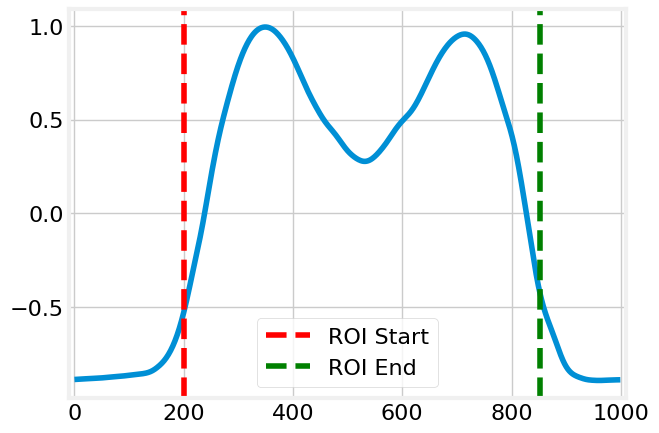

Iteration 1, Error:  26.0
Waiting to acquire
Acquired


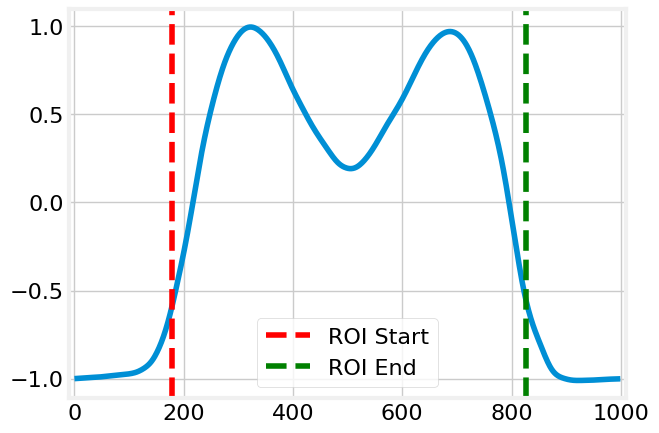

Iteration  2 , Error:  2.5
2720.706013302595
Burst:  1
Initial delay:  2720.706013302595
Final delay:  2069.9846031495545
Burst:  2
Initial delay:  2069.9846031495545
Final delay:  1480.0265470856925
Burst:  3
Initial delay:  1480.0265470856925
Final delay:  1088.227544830015
Burst:  4
Initial delay:  1088.227544830015
Final delay:  996.9619141023663
Preparing burst 1
Preparing burst 2
Preparing burst 3
Preparing burst 4
Scope defined bursts: dict_keys([1])
[[275.0, 264, 348, 1000, 1.0, 0.0, 0], [359.7066190511558, 535, 272, 1000, 1.0, 0.0, 0], [470.5048720125457, 620, 368, 1000, 1.0, 0.0, 0], [615.4314239917492, 844, 388, 1000, 1.0, 0.0, 0]]


In [142]:

# BEFORE RUNNING THIS CODE MAKE SURE THE INTENSITY IS LOW OTHERWISE YOU GET A SATURATED SIGNAL
#####################
# This needs to be set before starting the optimizer (check with the tomoscope 
# at which delay, in ns, does the bucket lie in the center of the acquisition_
min_delay = factor*(t_rev[0] - t_rev[-1])*1e9
print(min_delay)
init_delay = min_delay*1.5 + 100

ring = 3
####################
starting_ns_sampling = 1.0
prev_ns_sampling = None 
burst_configs = []
delay_configs = []

burst_dict = find_best_bursts(cycle_time, start_times[1:])
print(burst_dict)

# Set the attenuator to its lowest level fot the highest SNR at low intensities
if ring == 1:
    attenuator_setting  = 'BR12.ATTN.LBO/AttenuatorPPM'
    channel  = 'Channel1'
elif ring == 2:
    attenuator_setting  = 'BR12.ATTN.LBO/AttenuatorPPM'
    channel  = 'Channel2'
elif ring == 3:
    attenuator_setting  = 'BR34.ATTN.LBO/AttenuatorPPM'
    channel  = 'Channel1'
elif ring == 4:
    attenuator_setting  = 'BR34.ATTN.LBO/AttenuatorPPM'
    channel  = 'Channel2'

time_response = client.set(attenuator_setting, context=user_context, value = 
                               {channel: int(0) }) # 0 dB

# Set the intial attempt to be equal to the synchronous phase

initial_attempts = np.array([np.array(start_times),-90 + phi_s_interp*180/np.pi])


bucket_finder_set_time , bucket_finder_set_phase = initial_attempts[0],initial_attempts[1]

bucket_finder_set_time = np.hstack((np.array([0.]), bucket_finder_set_time))

bucket_finder_set_phase = np.hstack((np.array([0.]), bucket_finder_set_phase))

time_response = client.set(f'BA{ring}.FGPRFH2/Settings', context=user_context, value = 
                               {'amplitudes': pyda.data.DiscreteFunction(bucket_finder_set_time,bucket_finder_set_phase)})

# Optimize the delay correction 

burst_dc, delay_dc = create_burst_and_delay(sim_arr[0], cycle_time, 200, t_rev, init_delay, frev_interp, prev_ns_sampling)

init_delay = delay_dc['triggerDelayNs'][-1] 

import pyjapc as pjc
p= pjc.PyJapc(user_context)
# for t in range(1,5):
#     print(p.setParam(f"BA{ring}X.STOMO.{t}/OutEnable#outEnabled", False)) # These should all be None (i.e. disabling the timers)

## Compute the initial delay 
delay_dict = calc_init_delay(user_context,ring,burst_dc,delay_dc,min_delay)

init_delay = delay_dict['triggerDelayNs'][0]

print(init_delay)

## Now use that initial delay to propagate all further delays
starting_ns_sampling = 1.0
prev_ns_sampling = None 
bursts, delays = create_all_burst_and_delays(burst_dict, t_rev, init_delay, frev_interp, prev_ns_sampling)

init_delay = delays['triggerDelayNs'][-1] 

# Define the bursts in the system interface
sys_int = define_full_bursts(user_context, ring, bursts, delays, sys_interface = None)



print(bursts)


In [140]:
# def reinterpolate_profile(bursts, burst_dict, data, times, f_rev_interp, n_points = 1000):
        
def reinterpolate_profile(data, times, f_rev_interp, n_points = 1000,print_bounds = False):
    """
    This function is to take the profiles, and by knowing their sampling interval and how many samples,
    first select only the central part of the profile (around the center of mass) with the width of the t_rev corresponding to the
    turn. Then, make an x-axis going from -pi to pi, and reinterpolate the selected profile to have n_points points.

    Parameters:
    bursts: list of burst configurations
    data_per_burst: list of lists of profiles (one per burst)
    times_per_burst: list of lists of acquisition times (one per burst)
    cycle_times: list of acquisition timestime_response
    t_rev: list of turn times
    n_points: number of points in the reinterpolated profile
    """
    
    final_data = []
    # burst_intervals = []
    # for i,burst in enumerate(burst_dict): 
    #     burst_intervals.append((burst['start_time'],burst['end_time'], bursts[i][4])) # start, end, sampling
            
    x_inds = np.arange(0, n_points).astype(int)
    for t,profile in enumerate(data):
        
        acq_time = times[t]
        # for bstart, bend, sampling in burst_intervals:
        #         if bstart <= acq_time < bend:
        #             sample_interval = sampling
        #             break

        sample_interval = 1
                    
        t_rev = 1/f_rev_interp(acq_time) *1e9 # in ns 
        
        _, bounds ,_ = roi_extract(profile-np.min(profile), tol=0.6, return_bound=True) 
        if print_bounds:
            print(bounds)
        # attempts = True
        # bound_inc = 100
        # while attempts:
        #     try:
        #         select_profile = spline_smooth(profile[bounds[0]-bound_inc, bounds[1]+bound_inc])
        #         attempts = False 
        #     except: 
        #         bound_inc += -1 
        com_index = (bounds[0] + bounds[1])//2
        
        if t!=0:
            if np.abs(com_index - prev_com_index)>=100:
                t_axis = np.arange(len(profile)) * sample_interval
                com_time_corr = t_axis[prev_com_index]
                t_rel = t_axis - com_time_corr
                mask = (t_rel >= -t_rev/2) & (t_rel < t_rev/2)
                ind_i = np.where(t_rel >= -t_rev/2)[0][0]
                _, bounds2 ,_ = roi_extract(profile[mask]-np.min(profile[mask]), tol=0.6, return_bound=True) 
                com_index = (bounds2[0] + bounds2[1] +2* ind_i)//2

        prev_com_index = com_index
        # compute time axis for the profile
        t_axis = np.arange(len(profile)) * sample_interval
        # compute center‐of‐mass time
        com_time = t_axis[com_index]
        # shift to relative time around the COM
        t_rel = t_axis - com_time
        # select the segment within ±t_rev/2
        mask = (t_rel >= -t_rev/2) & (t_rel < t_rev/2)
        
        select_times = t_rel[mask]
        zero_out_profile = profile - profile.min()
        zero_out_profile[:bounds[0]-50] = 0
        zero_out_profile[bounds[1]+51:] = 0 
        select_profile = spline_smooth(zero_out_profile[mask]) 
        select_profile = zero_out_profile[mask]
        # select_profile -= np.min(select_profile)
        # define a uniform grid of n_points over the same window
        uniform_t = np.linspace(-t_rev/2, t_rev/2, n_points)
        # reinterpolate onto the uniform grid (fill outside with zeros)
        final_prof = np.interp(uniform_t, select_times, select_profile, left=0, right=0)
        final_prof = np.where(final_prof<0 , 0, final_prof)
        
        # select_profile, bounds ,grad_norm = roi_extract(spline_smooth(profile), tol=0.6, return_bound=True) 
        # ind_length = len(select_profile)
        
        # n_points_added = n_points - ind_length
        
        # offset_prof = select_profile - np.min(select_profile)
        
        # if n_points_added%2 == 0:
            
        
        #     final_prof = np.pad(offset_prof, (n_points_added//2,n_points_added//2), 'constant',constant_values=(0,0))
        # else: 
            
        #     final_prof = np.pad(offset_prof, (n_points_added//2+1,n_points_added//2), 'constant',constant_values=(0,0))

        

        assert len(final_prof) == n_points , f'Index {i,t} Points added: {n_points_added}  Profile length: {len(final_prof)}'
        
        final_data.append(final_prof/np.max(final_prof))
        # final_data.append(final_prof/final_prof.max())
            # if n_points_added+ind_length < 1000:
            #     n_points_added = 1000 - ind_length
            #     
                
            # elif n_points_added+ind_length > 1000:
        
        
                
            
    return final_data




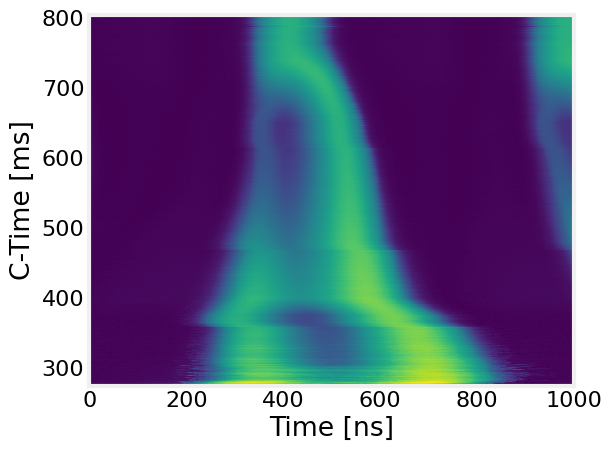

1353


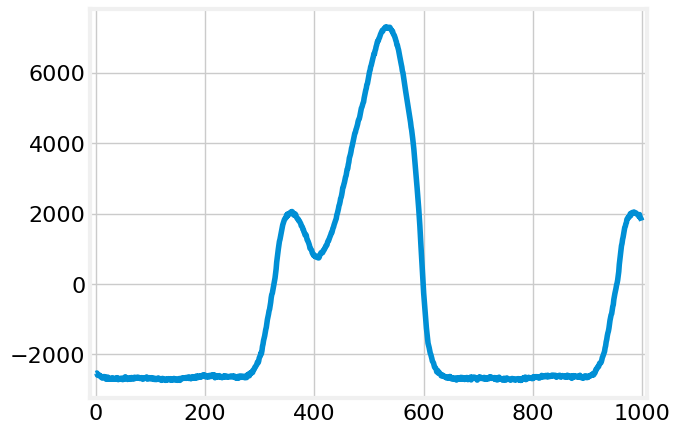

In [143]:
# for i, profile in enumerate(data[0]): 
#     plt.plot(profile, color = plt.cm.viridis((acq_times[i]-acq_times[0])/(acq_times[-1]-acq_times[0])))
# data , acq_times , data_per_burst, times_per_burst = get_acq_waiting_cnn(sys_int, None, tester= False)
# 
data , acq_times , data_per_burst, times_per_burst = get_acq_waiting_cnn(sys_int, None, tester= False)
ind = np.argmin(np.abs(acq_times-550))
profile_des = data[ind]
acq_time = acq_times[ind]
c1 = 500


fig=plt.figure()
ax = fig.add_subplot(111)
p = ax.pcolormesh(np.linspace(0,1000,1000),acq_times,[ (profile-np.min(profile))/np.max(profile) for profile in data], cmap='viridis', linewidth=0,antialiased=False)

plt.ylabel('C-Time [ms]')
plt.xlabel('Time [ns]')
plt.tight_layout()
plt.savefig('Initial_waterfall_NORMHRS.png')
plt.show()
print(len(data)) 

plt.plot(profile_des)
plt.show()



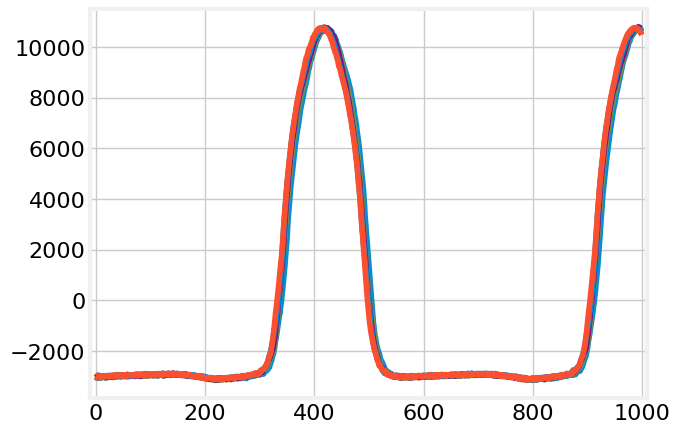

[801.1161  801.59937 802.0827  802.566   803.0493  803.5326  804.0159
 804.4992 ]


In [144]:
for profile in data[-8:]:
    plt.plot(profile)
plt.show()
print(acq_times[-8:])

[[274.0, 521, 290, 1000, 1.0, 0.0, 0], [406.4993303062224, 481, 395, 1000, 1.0, 0.0, 0], [538.9996197549557, 566, 392, 1000, 1.0, 0.0, 0], [671.4996146125129, 632, 377, 1000, 1.0, 0.0, 0]]
[290, 395, 392, 377]


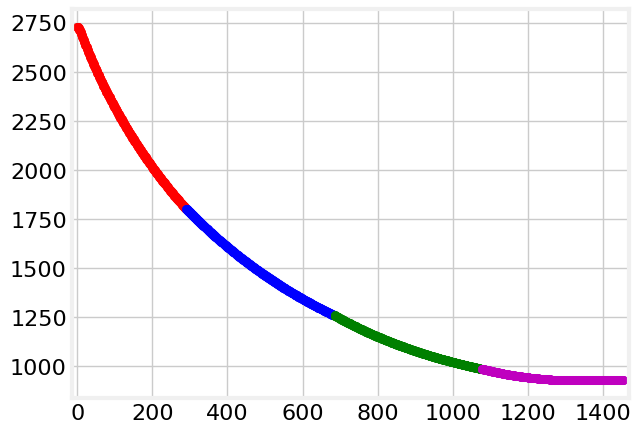

In [10]:
print(bursts)
# print(delays['triggerDelayNs'][300:-300])
# print(delays['burstId'][300:-300])
counters = [0,0,0,0]
for i, delay in enumerate(delays['triggerDelayNs']):
    
    color = ['r','b','g','m']
    plt.scatter(i,delay, color = color[delays['burstId'][i]-1])
    counters[delays['burstId'][i]-1]+=1
print(counters)
plt.show()

In [145]:
import torch
import torch.nn.functional as F  
import joblib 
class ChannelAttention(torch.nn.Module):
    """Channel-wise attention module"""
    def __init__(self, channels, reduction=4):
        super().__init__()
        self.avg_pool = torch.nn.AdaptiveAvgPool1d(1)
        self.max_pool = torch.nn.AdaptiveMaxPool1d(1)
        
        self.mlp = torch.nn.Sequential(
            torch.nn.Linear(channels, channels // reduction),
            torch.nn.ReLU(),
            torch.nn.Linear(channels // reduction, channels),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        avg_out = self.mlp(self.avg_pool(x).squeeze(-1))
        max_out = self.mlp(self.max_pool(x).squeeze(-1))
        return torch.sigmoid(avg_out + max_out)

class SpatialAttention(torch.nn.Module):
    """Spatial attention module"""
    def __init__(self):
        super().__init__()
        self.conv = torch.nn.Conv1d(2, 1, kernel_size=3, padding=1)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        combined = torch.cat([avg_out, max_out], dim=1)
        return self.sigmoid(self.conv(combined))


class PhaseAdjustmentModel_no_params(torch.nn.Module):
    def __init__(self, input_size=1000, 
                 conv1_channels=16, conv2_channels=32, 
                 kernel_size=5, fc1_size=128, fc2_size=64,
                 reduction=4):
        super().__init__()
        self.input_size = input_size
        padding = kernel_size // 2  # to preserve input length
        
        self.conv1 = torch.nn.Conv1d(1, conv1_channels, kernel_size, padding=padding)
        self.bn1 = torch.nn.BatchNorm1d(conv1_channels)
        self.attn1 = ChannelAttention(conv1_channels, reduction=reduction)
        self.conv2 = torch.nn.Conv1d(conv1_channels, conv2_channels, kernel_size, padding=padding)
        self.bn2 = torch.nn.BatchNorm1d(conv2_channels)
        self.attn2 = SpatialAttention()
        self.pool = torch.nn.AdaptiveMaxPool1d(input_size//4)

        self.phase_head = torch.nn.Sequential(
            torch.nn.Linear(conv2_channels*(input_size//4) + 1, fc1_size),
            torch.nn.ReLU(),
            torch.nn.LayerNorm(fc1_size),
            torch.nn.Linear(fc1_size, fc2_size),
            torch.nn.ReLU(),
            torch.nn.LayerNorm(fc2_size),
            torch.nn.Linear(fc2_size, 2),
            torch.nn.Tanh()
        )

    def activations_hook(self, grad):
        self.gradients = grad

    def forward(self, state, phi_s):
        x = state
        x = self.conv1(x)
        x = self.bn1(x)
        x = x * self.attn1(x).unsqueeze(-1)
        x = F.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = x * self.attn2(x)
        x = torch.tanh(x)

        # Register hook for GRAD-CAM
        # h = x.register_hook(self.activations_hook)
        # self.activations = x

        features = self.pool(x).flatten(1)
        features = torch.cat([features, phi_s], 1)
        final = self.phase_head(features)
        final = final / torch.norm(final, dim=1, keepdim=True).clamp(min=1e-8)
        return final

    def get_gradcam(self, target_class=None):
        """
        Compute GRAD-CAM heatmap for the target class.
        """
        if self.gradients is None or self.activations is None:
            raise ValueError("Forward pass must be completed before computing GRAD-CAM.")

        # Get gradients and activations
        gradients = self.gradients
        activations = self.activations

        # Pool gradients
        pooled_gradients = torch.mean(gradients, dim=[0, 2])  # [32]

        # Weight activations by pooled gradients
        for i in range(activations.size(1)):  # Loop over channels
            activations[:, i, :] *= pooled_gradients[i]

        # Average over channels
        heatmap = torch.mean(activations, dim=1, keepdim=True)  # [batch_size, 1, 1000]
        heatmap = F.relu(heatmap)  # Apply ReLU to highlight positive influences
        heatmap = heatmap.squeeze().detach().cpu().numpy()  # Convert to numpy array

        return heatmap

    def get_saliency_map(self, state, target_class=None):
        """
        Compute Saliency Map for the input.
        """
        state.requires_grad_()
        output = self.forward(state)

        if target_class is None:
            target_class = torch.argmax(output, dim=1)

        # Compute gradients of output with respect to input
        output[:, target_class].sum().backward()
        saliency_map = torch.abs(state.grad).squeeze().detach().cpu().numpy()

        return saliency_map



class NeuralCorrector:
    def __init__(self, model_path):
        study = joblib.load("interrupted_study.pkl")
        best_trial = study.best_trial
        self.model = PhaseAdjustmentModel_no_params(
            input_size=1000,
            conv1_channels=best_trial.params["conv1_channels"],
            conv2_channels=best_trial.params["conv2_channels"],
            kernel_size=best_trial.params["kernel_size"],
            fc1_size=best_trial.params["fc1_size"],
            fc2_size=best_trial.params["fc2_size"],
            reduction=best_trial.params["reduction"]
        ).eval()
        raw = torch.load(model_path,map_location=torch.device('cpu'))
        cleaned = {k.replace("module.",""): v for k,v in raw.items()}
        self.model.load_state_dict(cleaned)
        self.model.to(torch.device('cpu'))
        
    def __call__(self, profiles, phi_s):
        """Profiles: [batch_size, 2, N] tensor"""
        with torch.no_grad():
            res = self.model(profiles,phi_s)
            return torch.atan2(res[:,1],res[:,0])

In [146]:


def average_profiles_all_bursts(profiles, acquired_stamps, desired_c_times, burst_dict,bursts):
    """
    Averages profiles within intervals defined by desired_c_times using acquisitions from all bursts.
    
    Args:
        
        profiles (List): list of lists of profiles corresponding to each burst
        desired_c_times (List[float]): Desired sampling times.
        bursts (List[dict]): Burst configurations from find_best_bursts.
        
    Returns:
        List: Averaged profiles for each interval.
    """
    # Collect all acquired times and profiles from bursts
    acquired_ctimes = np.array(acquired_stamps).squeeze()
    acquired_profiles = np.array(profiles).squeeze()
    
    
    # Sort acquired data by time
    
    combined = sorted(zip(acquired_ctimes, acquired_profiles), key=lambda x: x[0])
    if not combined:
        return []
    acquired_ctimes_sorted, acquired_profiles_sorted = zip(*combined)
    
    # Create intervals between desired_c_times (sorted)
    sorted_desired = sorted(desired_c_times)
    n = len(sorted_desired)
    
    # midpoints between adjacent desired times
    midpoints = [(sorted_desired[i] + sorted_desired[i+1]) / 2
                    for i in range(n-1)]
    
    # extrapolate first and last boundary by half the adjacent interval
    last_delta  = sorted_desired[-1] - sorted_desired[-2]
    
    # boundaries = [sorted_desired[0]] \
    #             + midpoints \
    #             + [sorted_desired[-1] + last_delta/2]
    boundaries = list(sorted_desired) + [805]
    # stitch into n intervals
    intervals = [(boundaries[i], boundaries[i+1]) for i in range(n)]
    # Give 5 ms more of data to average out the turn by turn injection as much as possible
    intervals[0] = (sorted_desired[0] , 276.5) 
    burst_intervals = []
    for i,burst in enumerate(burst_dict): 
        burst_intervals.append((burst['start_time'],burst['end_time'], bursts[i][4])) # start, end, sampling
        
    avr_profiles = []
    avr_times = []
    for i, (start, end) in enumerate(intervals):
        # Find indices of acquired times in [start, end)
        left = bisect.bisect_left(acquired_ctimes_sorted, start)
        right = bisect.bisect_left(acquired_ctimes_sorted, end)
        selected = acquired_profiles_sorted[left:right]
        c_times = acquired_ctimes_sorted[left:right]

        # Filter selected profiles: group them by burst sampling intervals and select the largest group
        groups = {}
        time_groups = {}
        for t, prof in zip(c_times, selected):
            for bstart, bend, sampling in burst_intervals:
                if bstart <= t < bend:
                    groups.setdefault(sampling, []).append(prof)
                    time_groups.setdefault(sampling, []).append(t)
                    break # this breaks from the inner loop
        if groups:
            selected = max(groups.values(), key=len)
            c_times = max(time_groups.values(), key=len)
            
            

        if not selected:
            # Find closest profile to the interval
            pos = bisect.bisect_left(acquired_ctimes_sorted, start)
            if pos == 0:
                closest = acquired_ctimes_sorted[0]
            elif pos >= len(acquired_ctimes_sorted):
                closest = acquired_ctimes_sorted[-1]
            else:
                before = acquired_ctimes_sorted[pos-1]
                after = acquired_ctimes_sorted[pos]
                closest = before if (start - before) <= (after - start) else after
            index = bisect.bisect_left(acquired_ctimes_sorted,closest)
            selected = [acquired_profiles_sorted[index]]
            c_times = [acquired_ctimes_sorted[index]]
            
            
        # Average profiles to 1 profile (assuming profiles are numerical lists/arrays)
         
        avr_prof = np.mean(selected, axis=0)
        avr_time = np.mean(c_times)
        avr_profiles.append(avr_prof)
        avr_times.append(avr_time)

       
    assert len(avr_profiles)==len(desired_c_times)
    
    return avr_profiles, np.array(avr_times)

def comp_phase_array_multi(phase_arr,tvals, phase_sol_val, i,  phase_n, dentry, return_phase_sol = False):
    """
    This function sets the value of the phase array for a given entry, defined by its index i in sim_arr,
    and phase at the end of the optimization interval. It also sets all indexes after to phase_n.
    """
    dummy_sol = deepcopy(phase_sol_val)
    
    for m, dimension in enumerate(phase_n):
        if m==0 and i == 0:
            dummy_sol = dimension * np.ones_like(phase_sol_val)
        else:
            dummy_sol[m+i*dentry -(dentry-1)] = dimension
            
    dummy_sol[len(phase_n) + i*dentry -(dentry-1):] = dimension

    dummy_sol2 = deepcopy(dummy_sol)
    
    time_arr = phase_arr[0]

    dummy_sol = np.array(np.interp(time_arr,tvals,dummy_sol))

    if return_phase_sol:
        return pyda.data.DiscreteFunction(time_arr,dummy_sol) , dummy_sol2
    else:
        return pyda.data.DiscreteFunction(time_arr,dummy_sol)
        
def comp_phase_array(phase_arr,tvals, phase_sol_val, i,  phase_n):
    """
    This function sets the value of the phase array for a given entry, defined by its index i in sim_arr,
    and phase at the end of the optimization interval. It also sets all indexes after to phase_n.
    """
    
    time_arr = phase_arr[0]
    phase_val_arr = phase_arr[1]

    phase_sol_val[i:] = phase_n

    dummy_sol = np.array(np.interp(time_arr,tvals,phase_sol_val))
        
    return pyda.data.DiscreteFunction(time_arr,dummy_sol)

    


def insert_times(phase_arr, tvals):
    # Check if tvals already has an entry in time_arr or within 10 ms of it, if so replace it with the value in tval

    time_arr = phase_arr[0]
    phase_val_arr = phase_arr[1]
    dummy_time = deepcopy(time_arr)
    
    for tval in tvals:
        if tval in dummy_time:
            pass
        elif np.abs(tval - dummy_time).min() < 0.01:
            dummy_time[np.abs(tval - dummy_time).argmin()] = tval
        else:
            # Add it and sort the array
            dummy_time = np.append(dummy_time, tval)
            dummy_time = np.sort(dummy_time)

    # Interpolate the voltage array to the new time array
    dummy_phase_val = np.interp(dummy_time, time_arr, phase_val_arr)

    return dummy_time, dummy_phase_val
    

def phase_wrap(phase_arr):
    return (phase_arr+180)%(360) - 180
    
def optimize_cycle(phase_sol, n_calls_max, model, client, sys_interface, bursts, burst_dict,phis_interp):
    result = None
    specs = {"args": locals(), "function": "base_minimize"}
    t_vals , phase_sol_val = phase_sol[0],phase_sol[1]

    init_set_phase = np.hstack((np.array([0.]), phase_sol_val))
    set_time = np.hstack((np.array([0.]), t_vals))
    # new_times, new_phase_val = insert_times(phase_arr,t_vals)
    time_response = client.set(f'BA{ring}.FGPRFH2/Settings', context=user_context, value = 
                               {'amplitudes': pyda.data.DiscreteFunction(set_time,init_set_phase)})

    phi_s = torch.tensor(phis_interp).to(torch.float32).unsqueeze(-1) /torch.pi

    phi_s_constant = np.where(np.abs(np.diff(init_set_phase))<1e-6 )[0]
    # end_cycle_idx = np.where(set_time>750)[0]
    # print(phi_s_constant)
    # print(end_cycle_idx)
    first_non_imp_ind = phi_s_constant[0] - 1
    prev_cycle_stamp = None
    current_phi = phase_sol_val
    corrections_list = []
    for n in range(n_calls_max):
        # Data Acquisition Sequence
        print('Acquiring data...')
        profiles, acq_time , _, _= get_acq_waiting_cnn(sys_interface,prev_cycle_stamp)
        print('Averaging profiles on their intervals...')
        avr_profiles, avr_times = average_profiles_all_bursts(profiles,acq_time,t_vals, burst_dict, bursts)
        print('Re-interpolating data to RF phase...')
        final_data = reinterpolate_profile(avr_profiles, avr_times, frev_interp, n_points = 1000)
        
        model_data = torch.tensor(final_data).to(torch.float32).unsqueeze(1)

        # Plotting Sequence
        norm = mpl.colors.Normalize(vmin = avr_times.min() , vmax = avr_times.max())
        cmap = plt.cm.viridis
        fig, ax = plt.subplots(1)
        for i, entry in enumerate(final_data):
            color_i  = cmap(norm(avr_times[i]))
            ax.plot(entry, color=color_i)
        sm = plt.cm.ScalarMappable(cmap=cmap)
        sm.set_clim(avr_times.min(), avr_times.max())
        cbar = fig.colorbar(sm, ax=ax, orientation='vertical')
        ax.set_xlabel('RF Phase [rad]')
        ax.set_ylabel('Normalized Intensity [-]')
        cbar.set_label('C-time [ms]')
        plt.tight_layout()
        plt.show()

        fig=plt.figure()
        ax = fig.add_subplot(111)
        p = ax.pcolormesh(np.linspace(0,1000,1000),acq_time,profiles, cmap='viridis', linewidth=0,antialiased=False)
        ax 
        plt.ylabel('C-Time [ms]')
        plt.xlabel('Time [ns]')
        ax.set_title(f'Correction Number {n+1}')
        plt.savefig(f'Waterfall_{n}_NORMHRS.png')
        plt.show()
        
        # Inference Sequence
        print('Inferring...')
        corrections = np.zeros_like(phi_s.detach.squeeze().cpu().numpy())
        for index, profile in enumerate(model_data): 
            obs = torch.cat([profile, phi_s[index]])
            corrections[index] = model.predict(obs, deterministic=True) *- 180/np.pi
        corrections_list.append(corrections)
        current_phi = phase_wrap(current_phi + corrections)

        
        set_phase = np.hstack((np.array([0.]), current_phi))
        # current_phi = np.where(np.abs(current_phi)>180, np.sign(current_phi)*180, current_phi)
        set_phase[first_non_imp_ind:] = set_phase[first_non_imp_ind-1]
        
        print('Trying at the following phase program')
        plt.figure()
        plt.plot(set_time,set_phase, label='Model Phase')
        plt.plot(v2p_times,v2p_val, label='Manual Set Phase')
        plt.xlabel('C-time [ms]')
        plt.ylabel(r'Machine $/Phi_2$')
        plt.show()
        
        
        
        v2p = client.set(f'BA{ring}.FGPRFH2/Settings', context=user_context, value = 
                         {'amplitudes': pyda.data.DiscreteFunction(set_time,set_phase)})
        
        
        prev_cycle_stamp = datetime.now(timezone.utc) + timedelta(milliseconds=1200)# This is done to make sure the acquisition is not coming from before the set 
        # Basically means if phase_set_time + 1.2 s > acquisition time, keep acquiring
        
        
        if n == n_calls_max - 1:
            profiles, acq_time , _, _= get_acq_waiting_cnn(sys_interface,prev_cycle_stamp)
            avr_profiles, avr_times = average_profiles_all_bursts(profiles,acq_time,start_times, burst_dict, bursts)
            final_data = reinterpolate_profile(avr_profiles, avr_times, frev_interp, n_points = 1000)
            # Plotting Sequence
            norm = mpl.colors.Normalize(vmin = avr_times.min() , vmax = avr_times.max())
            cmap = plt.cm.viridis
            fig, ax = plt.subplots(1)
            for i, entry in enumerate(final_data):
                color_i  = cmap(norm(avr_times[i]))
                ax.plot(entry, color=color_i)
            sm = plt.cm.ScalarMappable(cmap=cmap)
            sm.set_clim(avr_times.min(), avr_times.max())
            cbar = fig.colorbar(sm, ax=ax, orientation='vertical')
            ax.set_xlabel('RF Phase [rad]')
            ax.set_ylabel('Normalized Intensity [-]')
            cbar.set_label('C-time [ms]')
            plt.tight_layout()
            plt.show()
        if np.all(np.abs(corrections) <= 5e-1): # Might need to tune this
            print('Converged at iteration', n)
    return set_time, set_phase, corrections_list
    

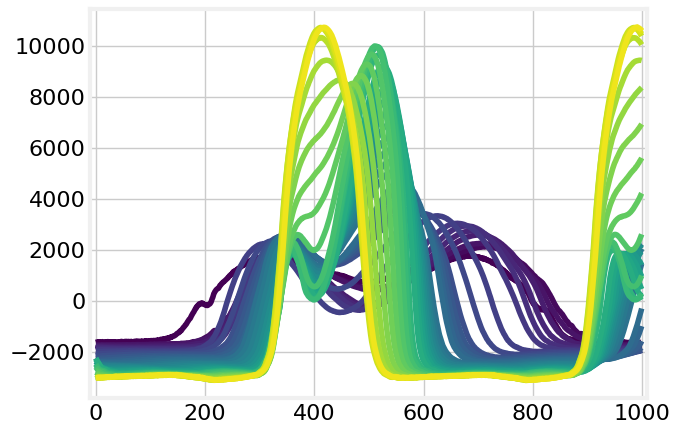

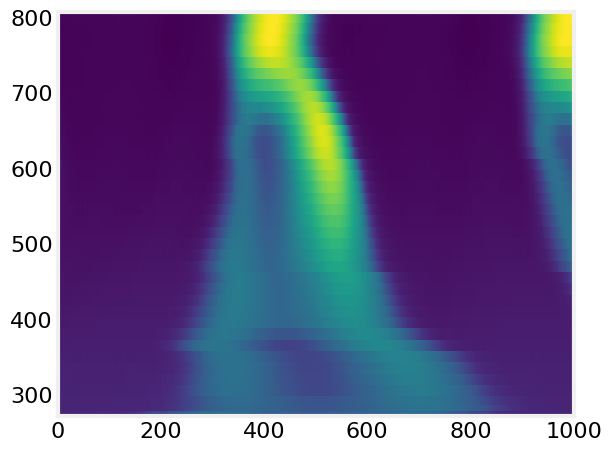

37 Time to complete: 26.906986236572266


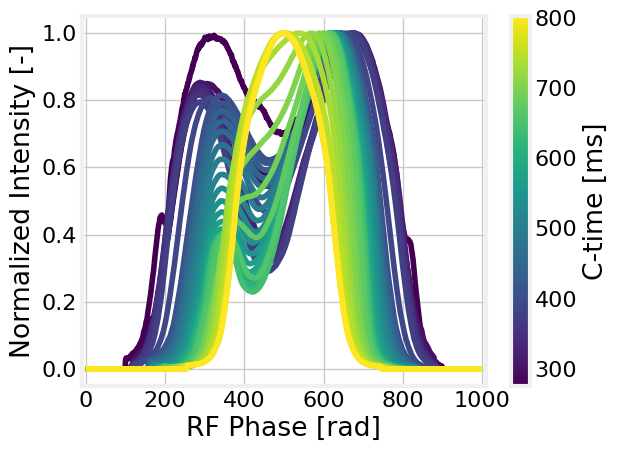

In [147]:
# Test the average profile segmentation
avr_profiles, avr_times = average_profiles_all_bursts(data,acq_times,start_times, burst_dict, bursts)
for i, profile in enumerate(avr_profiles):
    plt.plot(profile, color=plt.cm.viridis(i/len(avr_profiles)))

plt.show()

fig=plt.figure()
ax = fig.add_subplot(111)

p = ax.pcolormesh(np.linspace(0,1000,1000),start_times,np.array(avr_profiles), cmap='viridis', linewidth=0,antialiased=False)
plt.tight_layout()
plt.savefig('Averaged_NORMHRS')
plt.show()

a = time.time()
final_data = reinterpolate_profile(avr_profiles, avr_times, frev_interp, n_points = 1000)
b = time.time()
length = len(final_data)
print(length, 'Time to complete:', b-a)
norm = mpl.colors.Normalize(vmin = avr_times.min() , vmax = avr_times.max())
cmap = plt.cm.viridis
fig, ax = plt.subplots(1)

for i, entry in enumerate(final_data):
    color_i  = cmap(norm(avr_times[i]))
    ax.plot(entry, color=color_i)
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_clim(avr_times.min(), avr_times.max())

cbar = fig.colorbar(sm, ax=ax, orientation='vertical')
ax.set_xlabel('RF Phase [rad]')
ax.set_ylabel('Normalized Intensity [-]')
cbar.set_label('C-time [ms]')
plt.tight_layout()
plt.show()

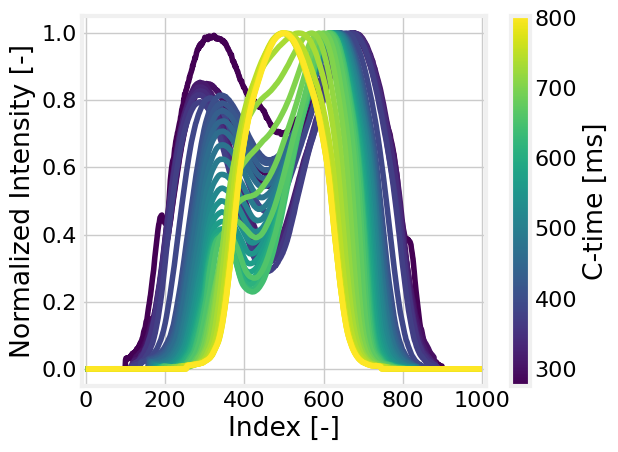

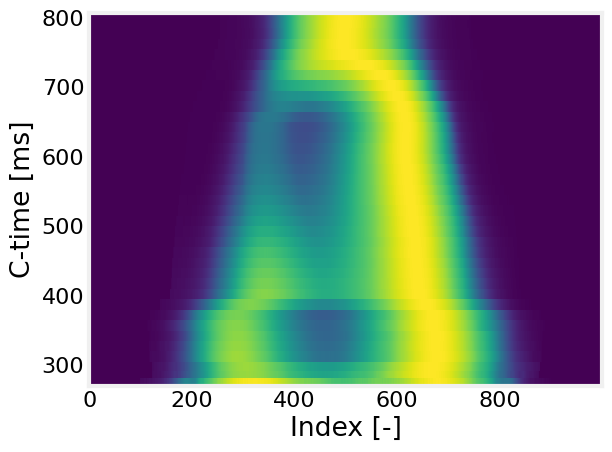

In [148]:
norm = mpl.colors.Normalize(vmin = avr_times.min() , vmax = avr_times.max())
cmap = plt.cm.viridis
fig, ax = plt.subplots(1)

for i, entry in enumerate(final_data):
    color_i  = cmap(norm(avr_times[i]))
    ax.plot(entry, color=color_i)
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_clim(avr_times.min(), avr_times.max())
cbar = fig.colorbar(sm, ax=ax, orientation='vertical')
ax.set_xlabel('Index [-]')
ax.set_ylabel('Normalized Intensity [-]')
cbar.set_label('C-time [ms]')
plt.tight_layout()
plt.show()

fig=plt.figure()
ax = fig.add_subplot(111)
p = ax.pcolormesh(np.arange(len(final_data[0])),avr_times,np.array(final_data), cmap='viridis', linewidth=0,antialiased=False)
ax.set_xlabel('Index [-]')
ax.set_ylabel('C-time [ms]')
plt.tight_layout()
plt.savefig('Reintrpolated_NORMHRS')
plt.show()

In [67]:
data , acq_times , data_per_burst, times_per_burst = get_acq_waiting_cnn(sys_int, None, tester= False)

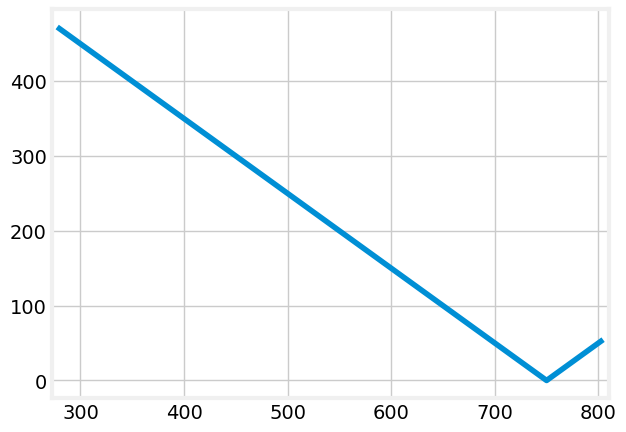

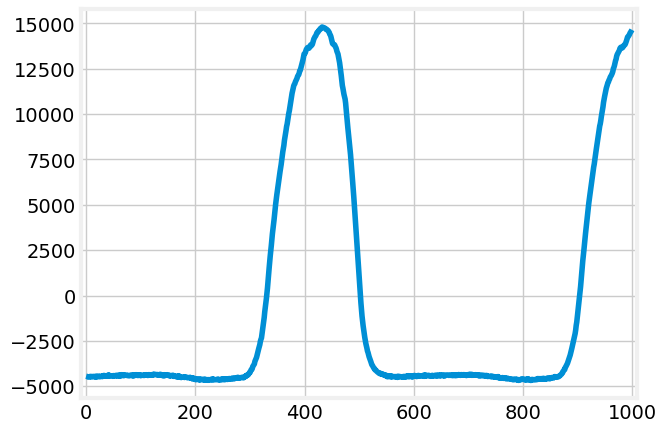

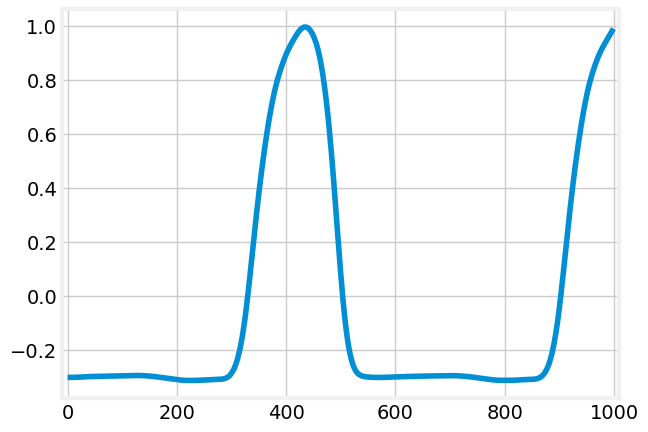

[750.0319393091901]
torch.Size([1, 1, 1000]) torch.Size([1, 1])
[22.104065]


In [43]:

c_time  = 750
ind = np.argmin(np.abs(acq_times-c_time))
plt.plot(acq_times,np.abs(acq_times-c_time))
plt.show()
plt.plot(data[ind])
plt.show()
plt.plot(spline_smooth(data[ind]))
plt.show()
profile_des = [data[ind]]
acq_time = [acq_times[ind]]
print(acq_time)
profile = reinterpolate_profile(profile_des, acq_time, frev_interp, print_bounds= True)
phi_s_sing = torch.tensor(np.interp(c_time, phi_s0[0] +275., phi_s0[1])).to(torch.float32).unsqueeze(-1).unsqueeze(-1)
input_profile = torch.tensor(profile).to(torch.float32).unsqueeze(1)
print(input_profile.shape, phi_s_sing.shape)
correction = model(input_profile,phi_s_sing)
print(-correction.numpy()*180/np.pi)

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


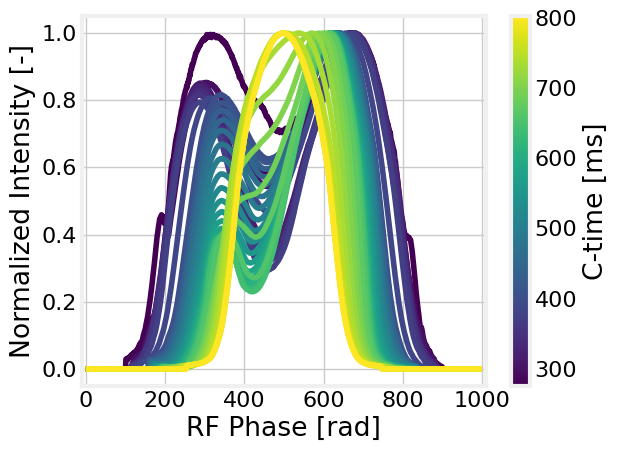

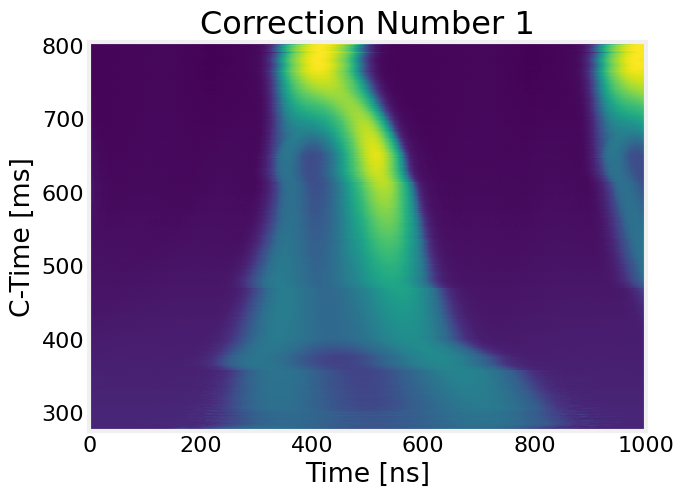

Inferring...
Trying at the following phase program


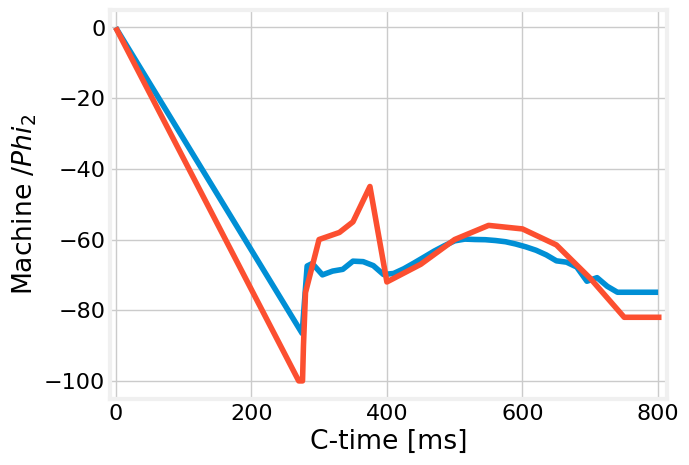

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


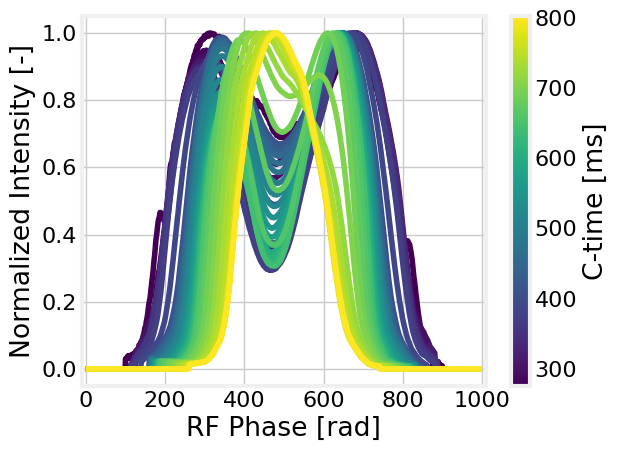

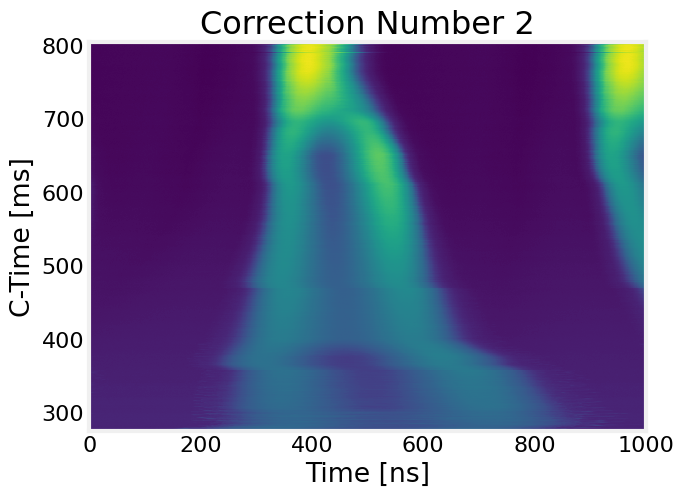

Inferring...
Trying at the following phase program


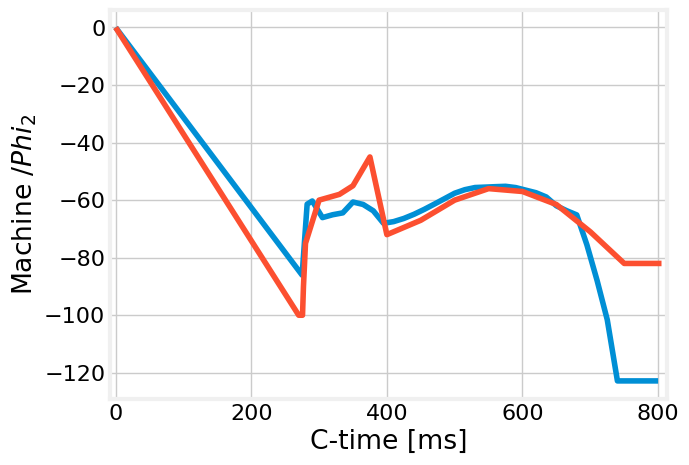

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


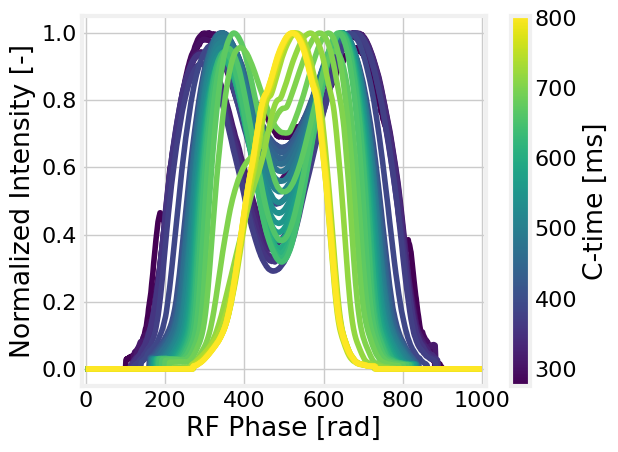

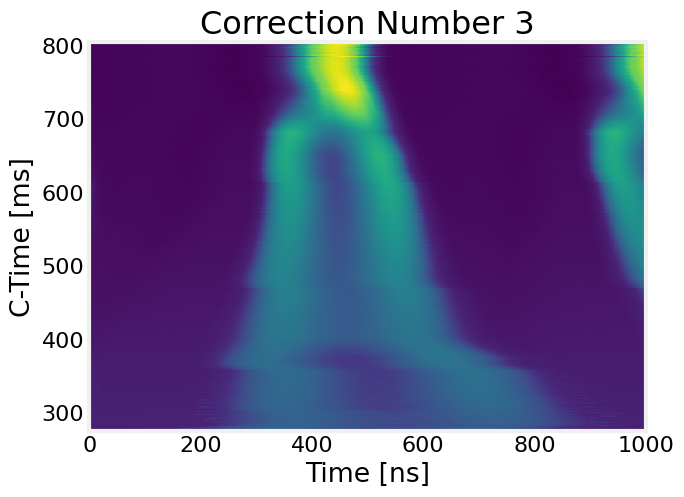

Inferring...
Trying at the following phase program


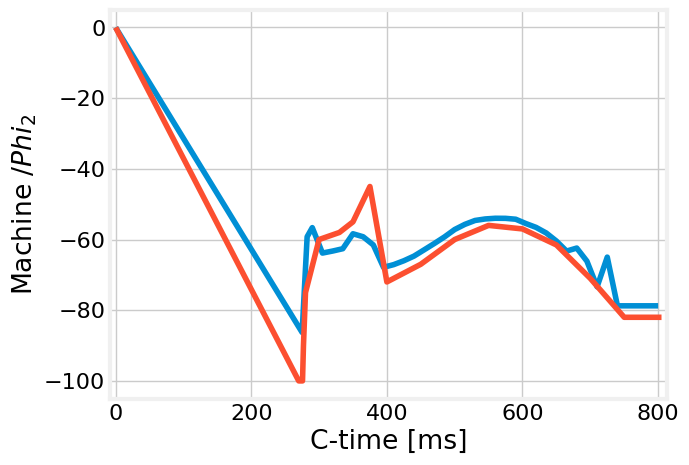

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


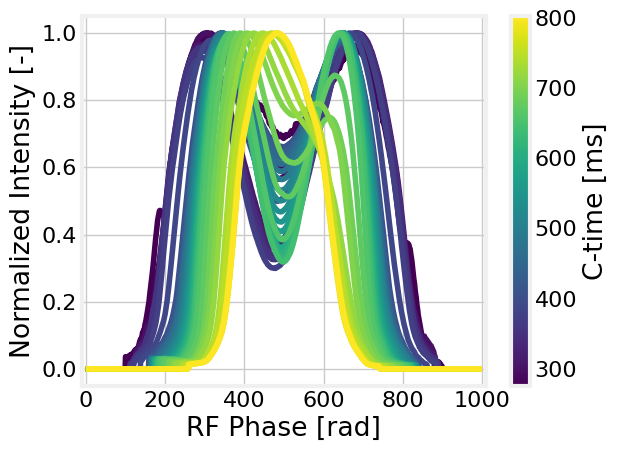

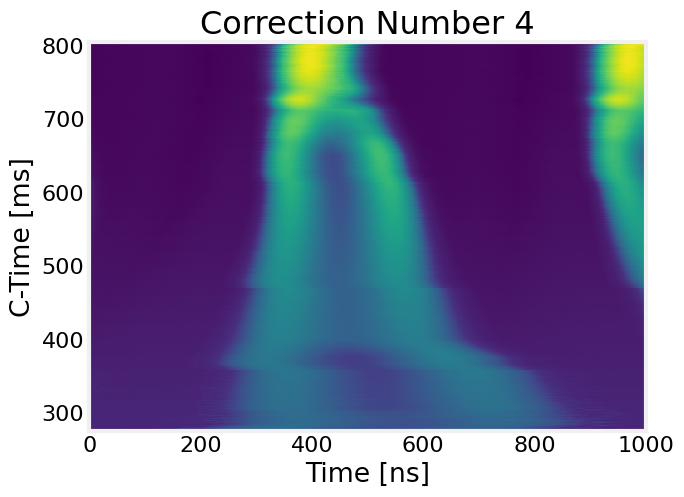

Inferring...
Trying at the following phase program


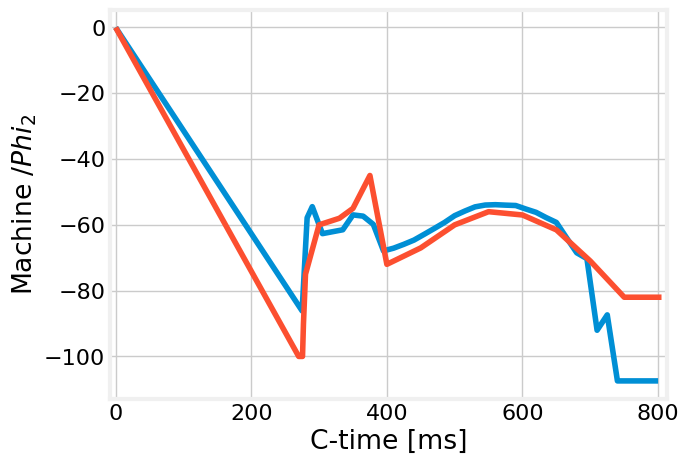

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


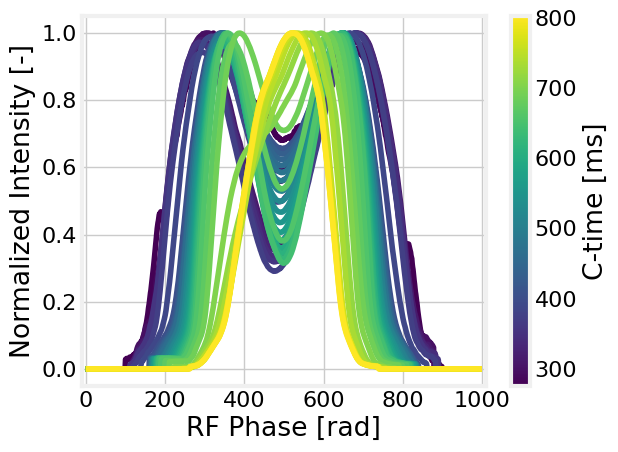

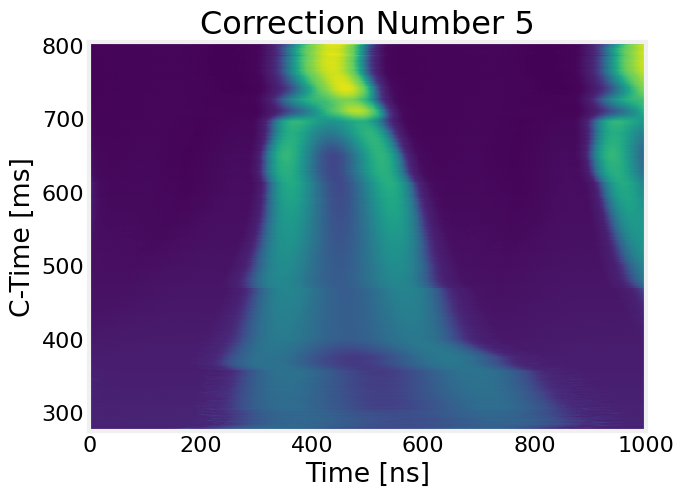

Inferring...
Trying at the following phase program


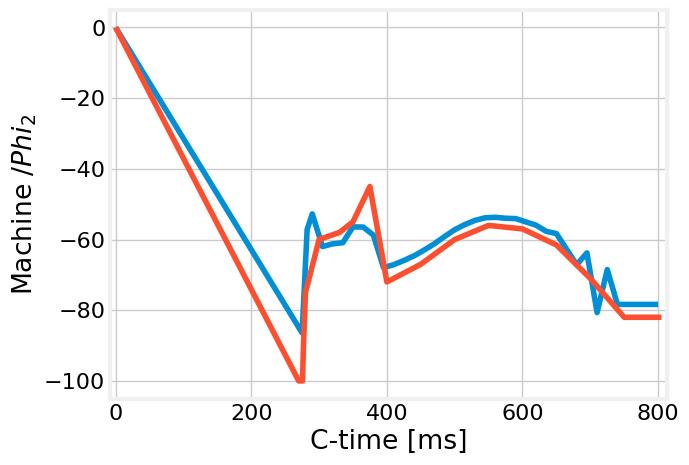

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


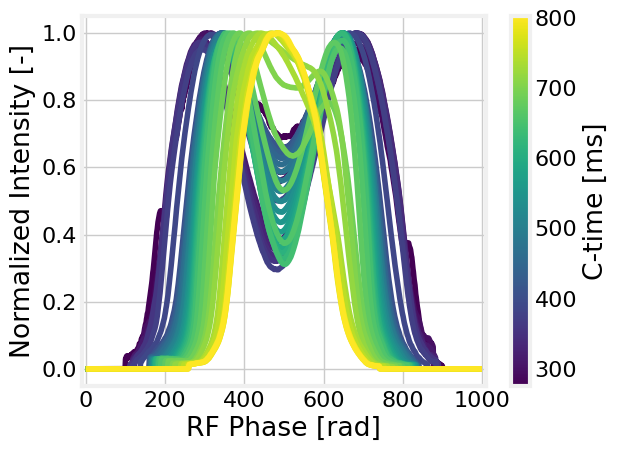

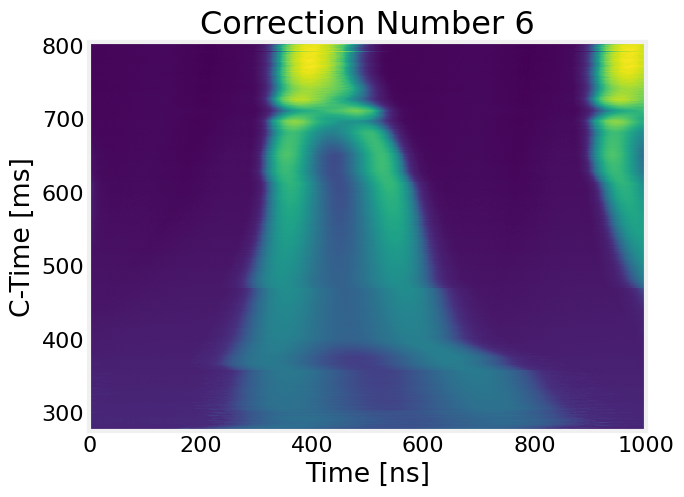

Inferring...
Trying at the following phase program


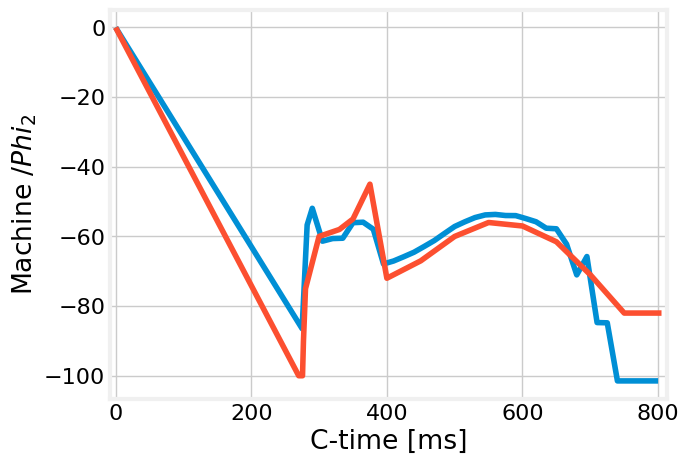

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


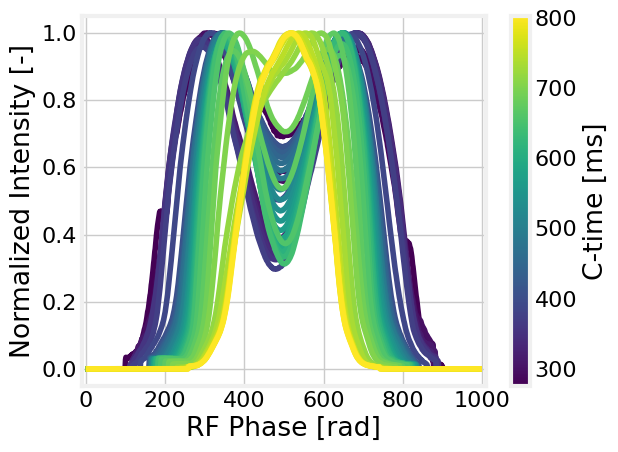

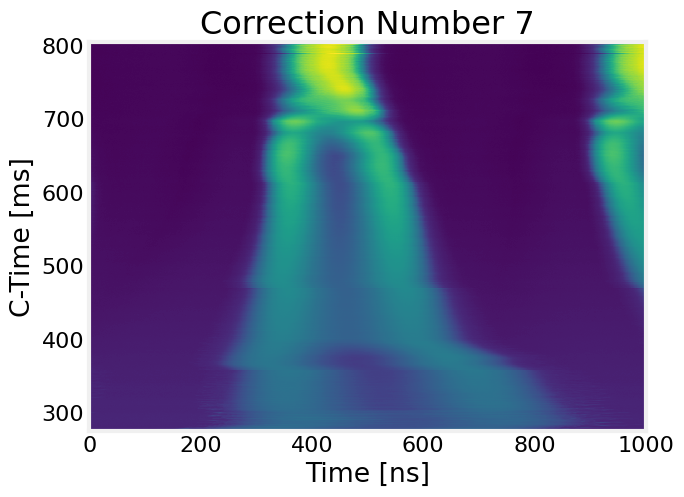

Inferring...
Trying at the following phase program


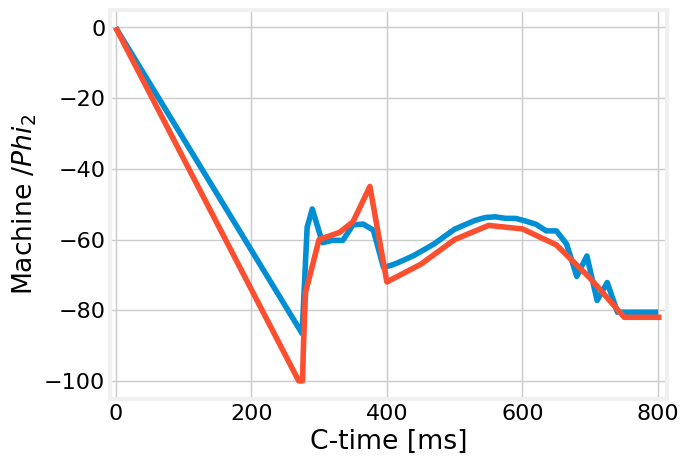

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


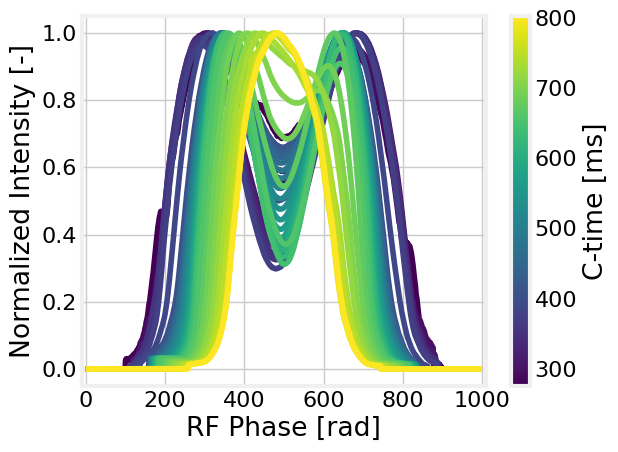

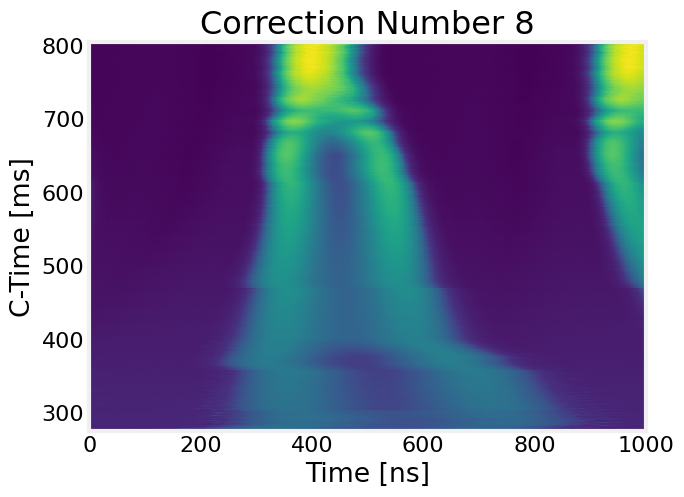

Inferring...
Trying at the following phase program


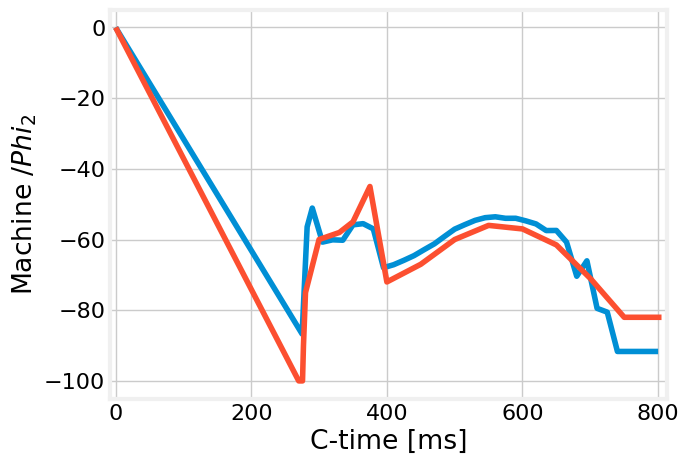

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


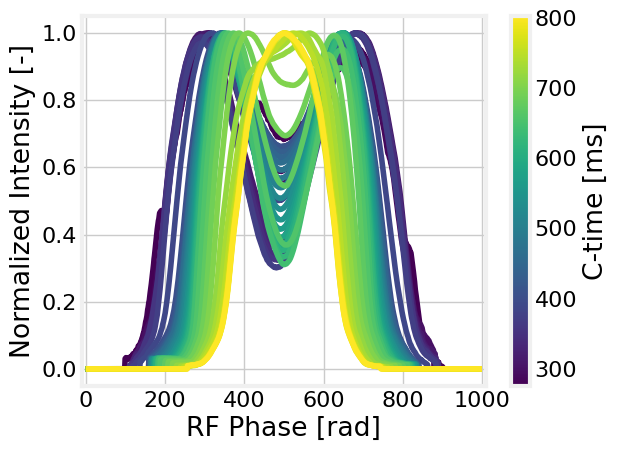

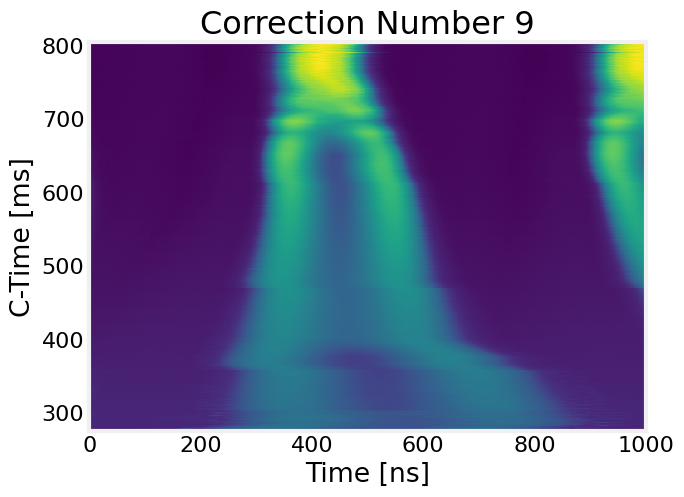

Inferring...
Trying at the following phase program


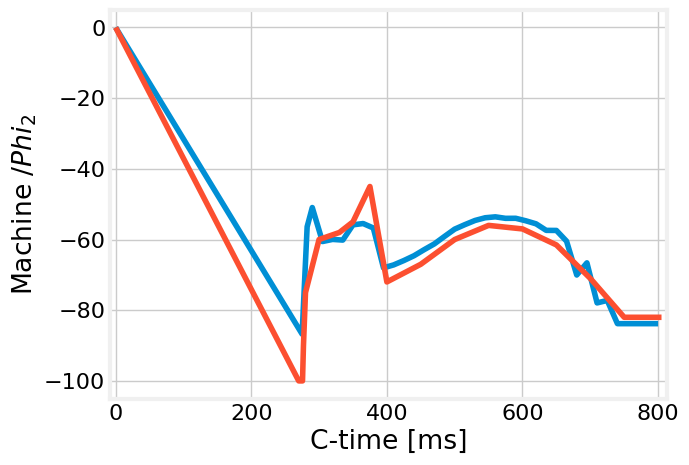

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


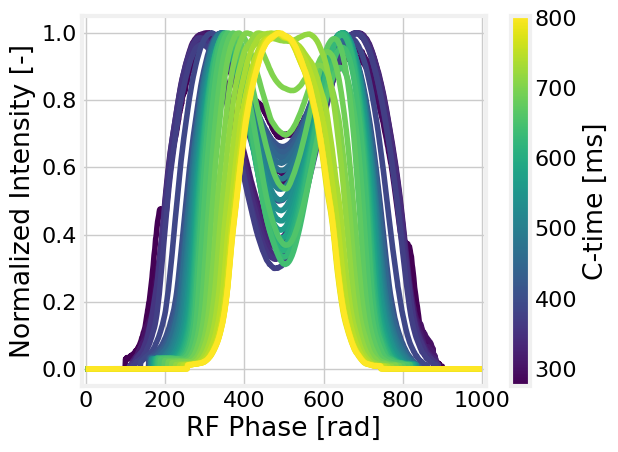

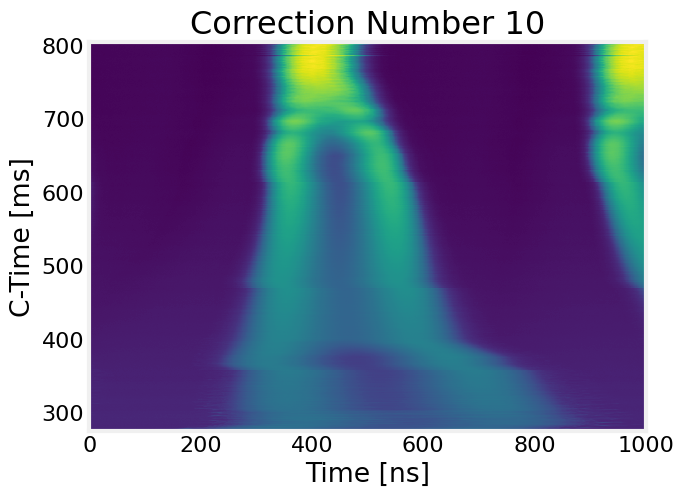

Inferring...
Trying at the following phase program


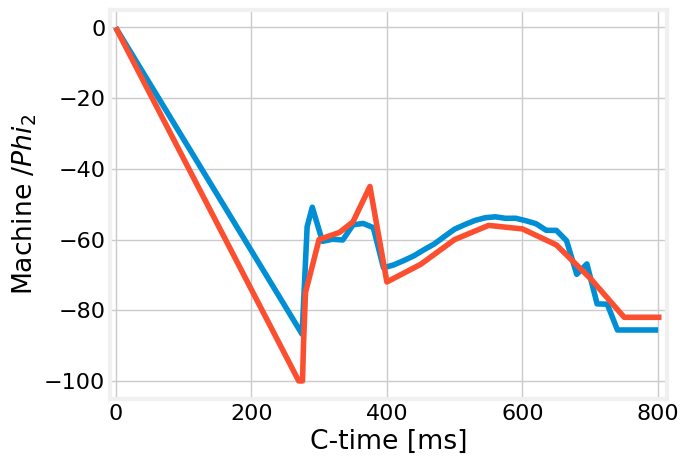

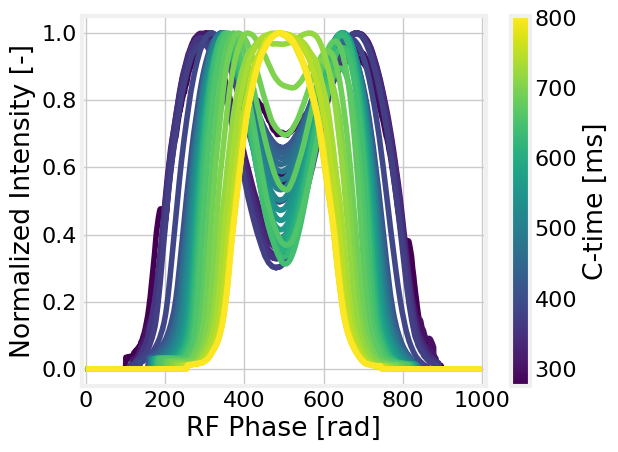

In [149]:
from functools import partial 
from stable_baselines3 import TD3

model = TD3.load('best_model_rl.zip')
# Get the V2 phase
v2p = client.get('BA3.FGPRFH2/Settings#amplitudes', context=user_context)
v2pp = v2p.value.get('value')[0] # in ms
print(v2pp)
v2_phase_times = v2pp.xs
v2_phase_val = v2pp.ys # in deg

v2_phase = np.array([v2_phase_times, v2_phase_val])


n_calls_max = 10
results= []
prev_sol = None



phase_sol = np.array([np.array(start_times),-90 + phi_s_interp*180/np.pi])

t_vals , phase_sol_val = phase_sol[0],phase_sol[1]

# new_times, new_phase_val = insert_times(phase_arr,t_vals)
# time_response = client.set('BA3.FGPRFH2/Settings', context=user_context, value = 
#                            {'amplitudes': pyda.data.DiscreteFunction(t_vals,phase_sol_val)})

# optimize_cycle(phase_sol, n_calls_max, model, client, sys_interface, bursts, burst_dict)

# NOTES: There is likely a problem with the CNN acquisition function, it always returns the same thing

phase_times, phase_vals ,corrections_list = optimize_cycle(phase_sol, n_calls_max, model, client, sys_int, bursts, burst_dict,phi_s_interp)


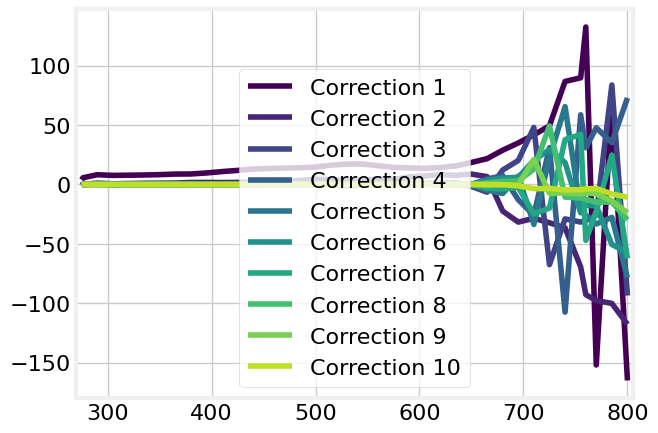

In [18]:
for i, correction in enumerate(corrections_list):
    plt.plot(phase_times[1:], correction, color = plt.cm.viridis(i/len(corrections_list)), label=f'Correction {i+1}')
plt.legend()
plt.show()


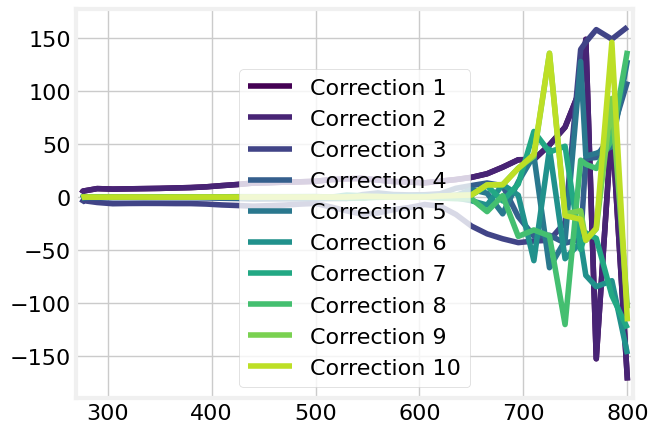

In [21]:
for i, correction in enumerate(corrections_list):
    plt.plot(phase_times[1:], correction, color = plt.cm.viridis(i/len(corrections_list)), label=f'Correction {i+1}')
plt.legend()
plt.show()

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


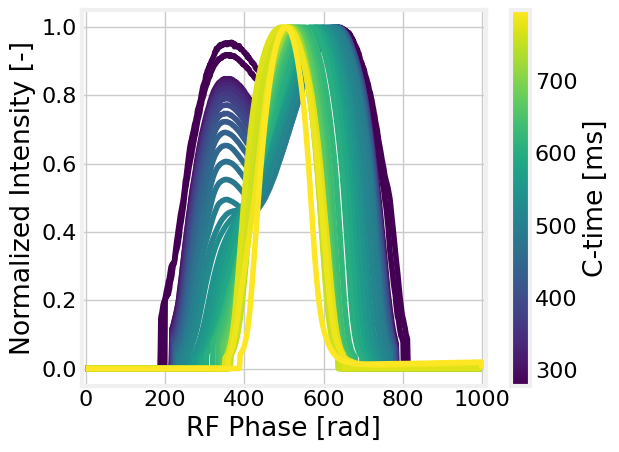

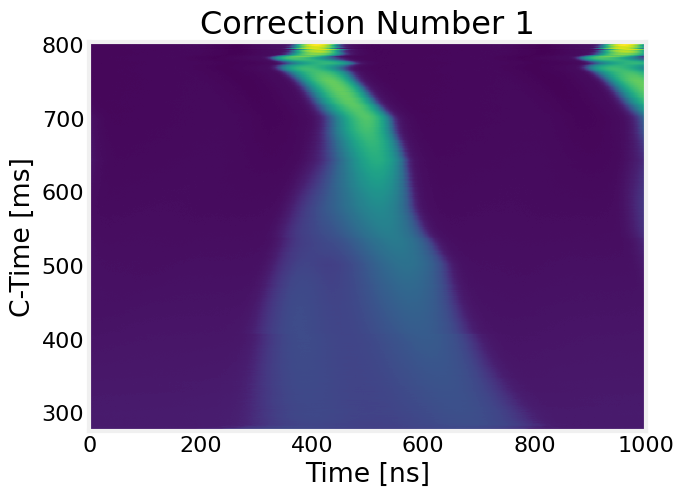

Inferring...
Trying at the following phase program


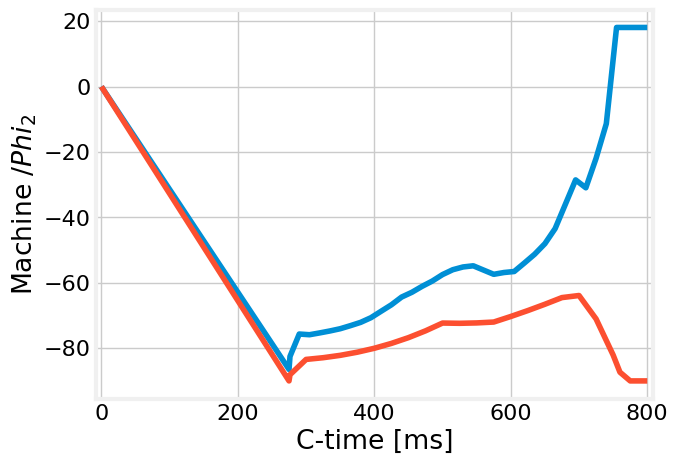

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


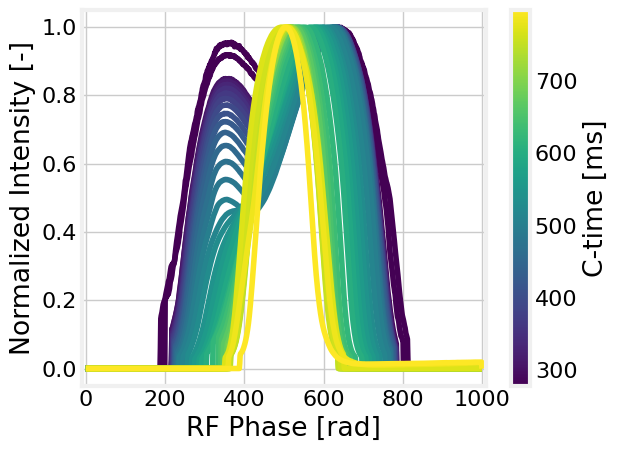

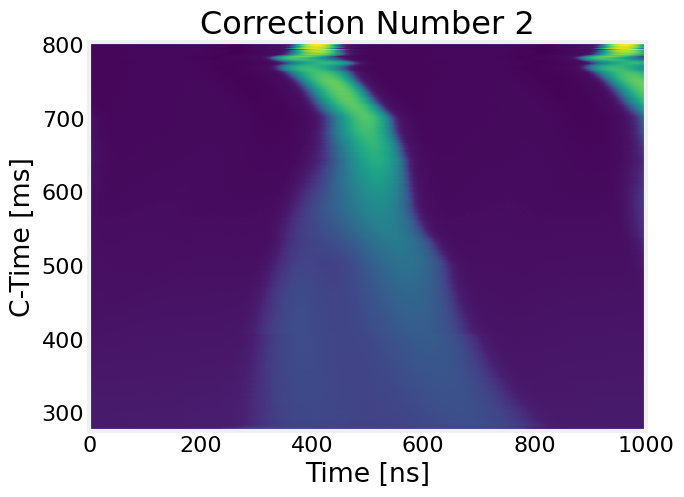

Inferring...
Trying at the following phase program


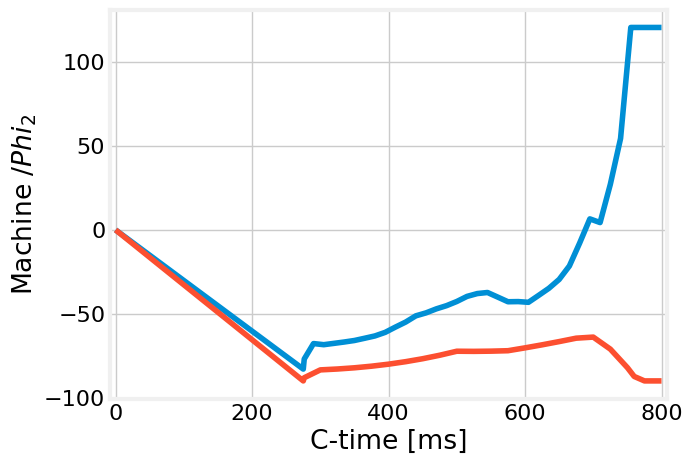

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


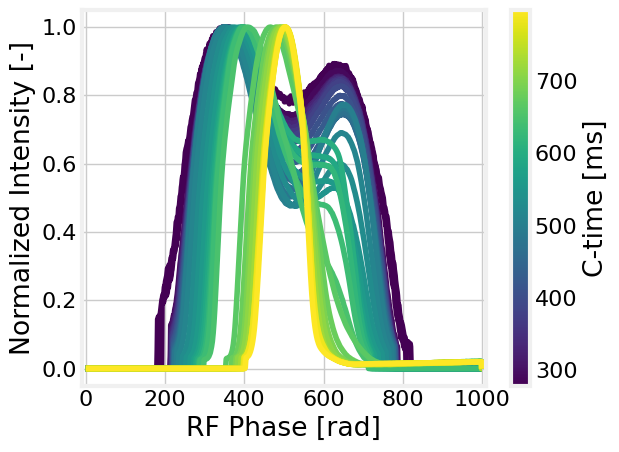

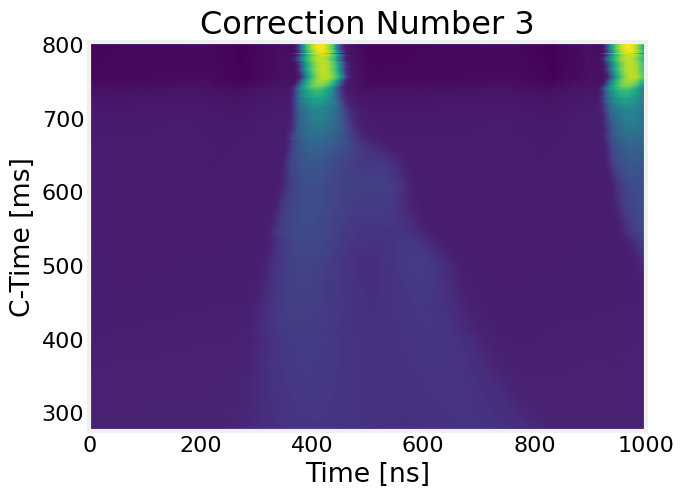

Inferring...
Trying at the following phase program


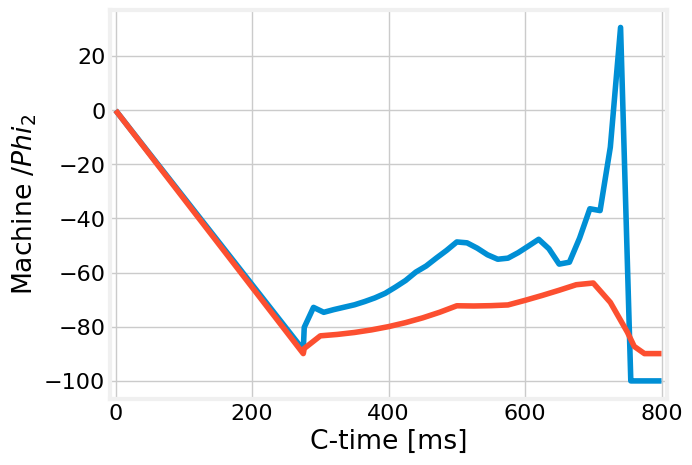

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


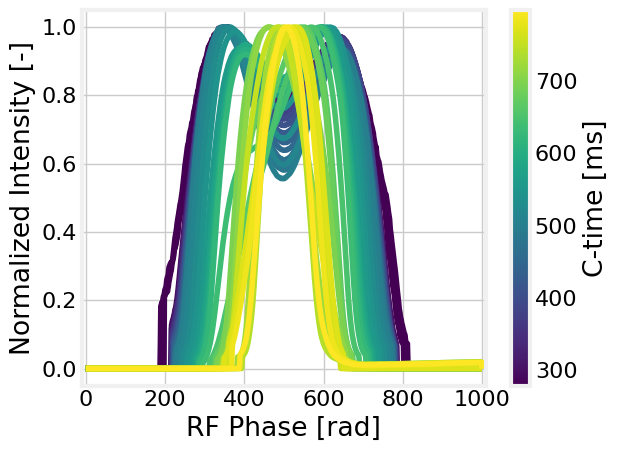

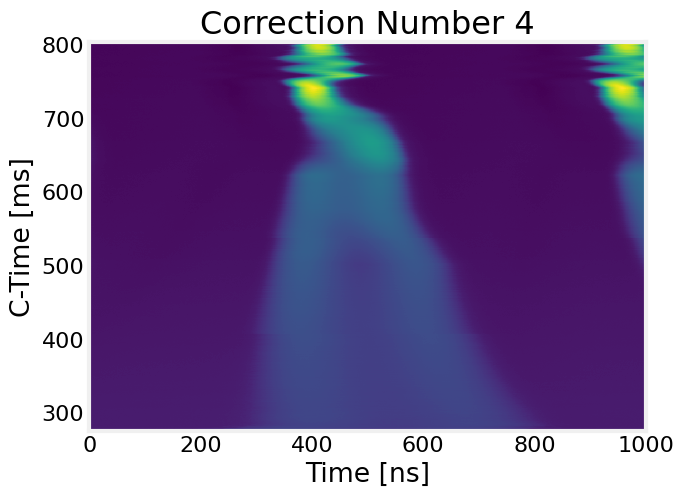

Inferring...
Trying at the following phase program


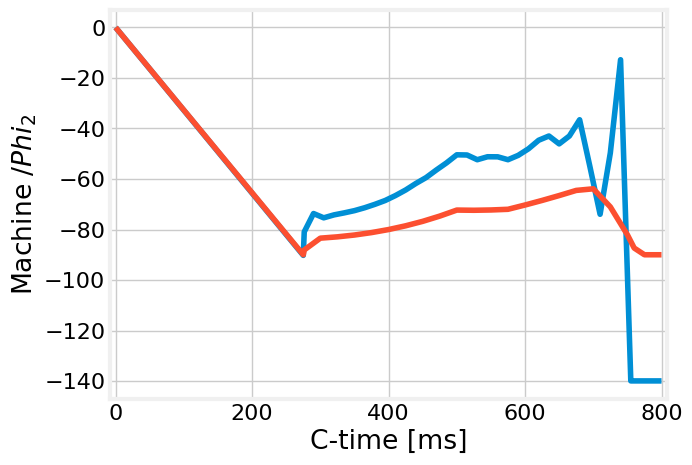

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


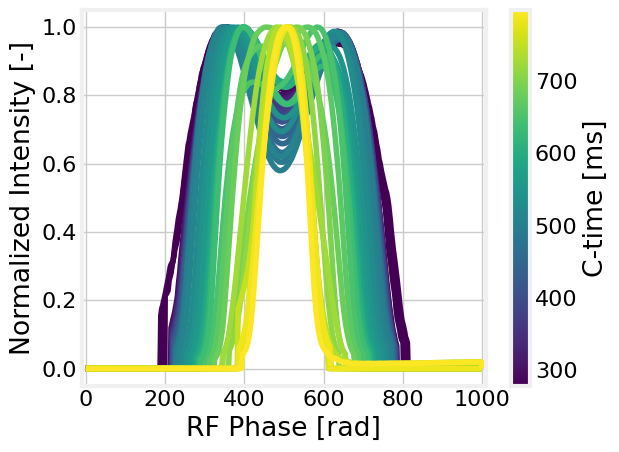

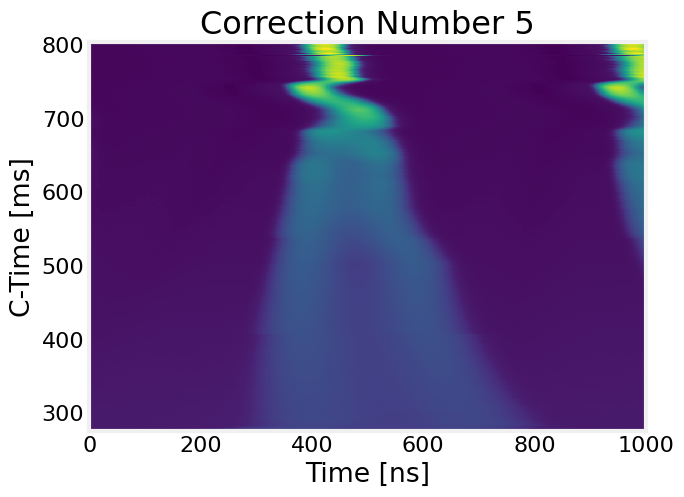

Inferring...
Trying at the following phase program


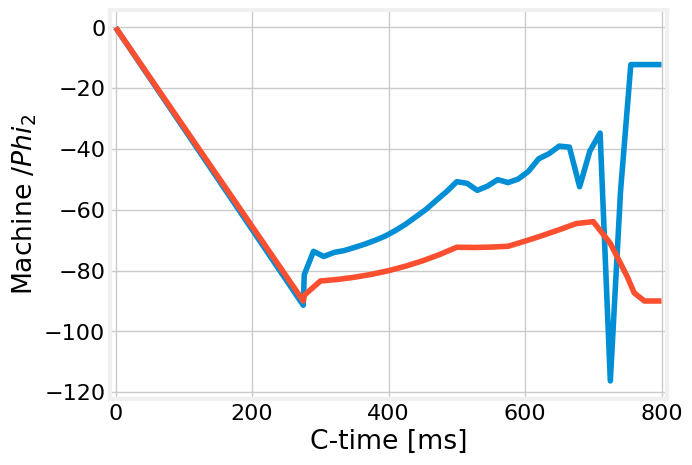

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


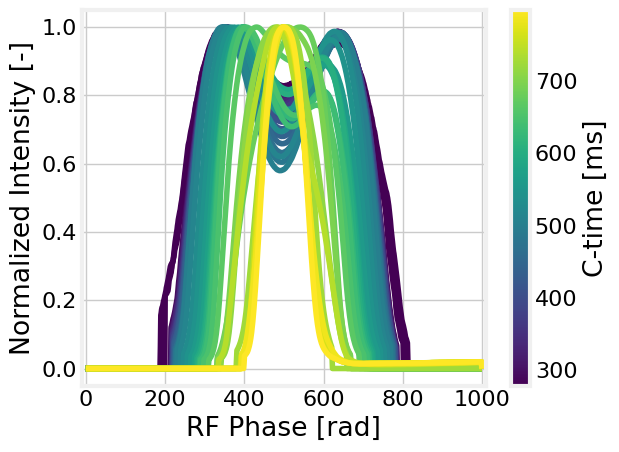

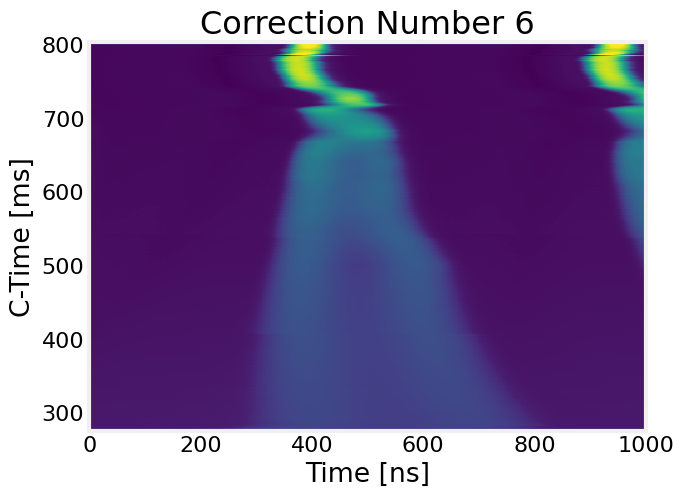

Inferring...
Trying at the following phase program


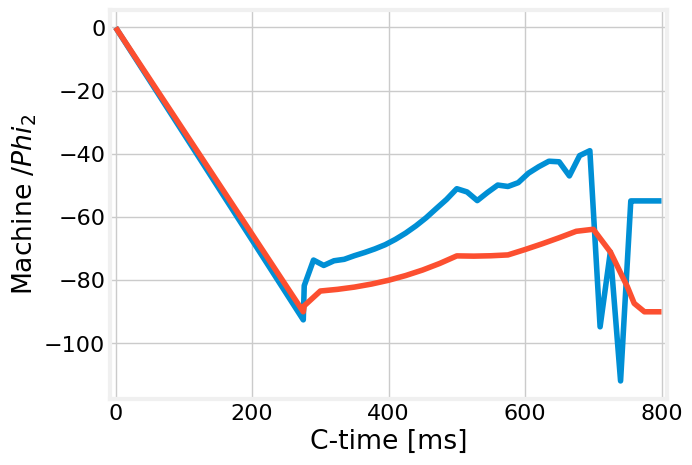

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


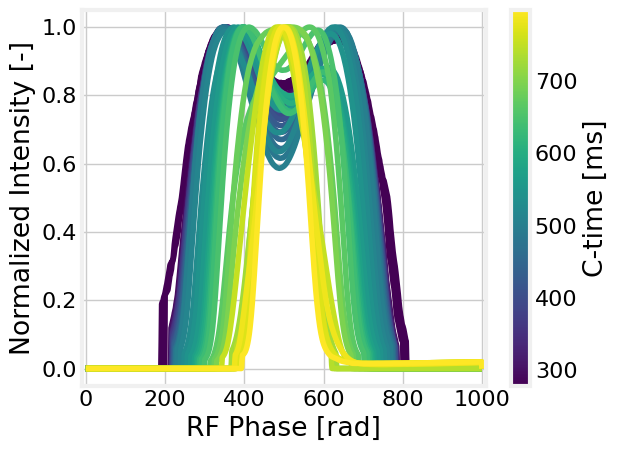

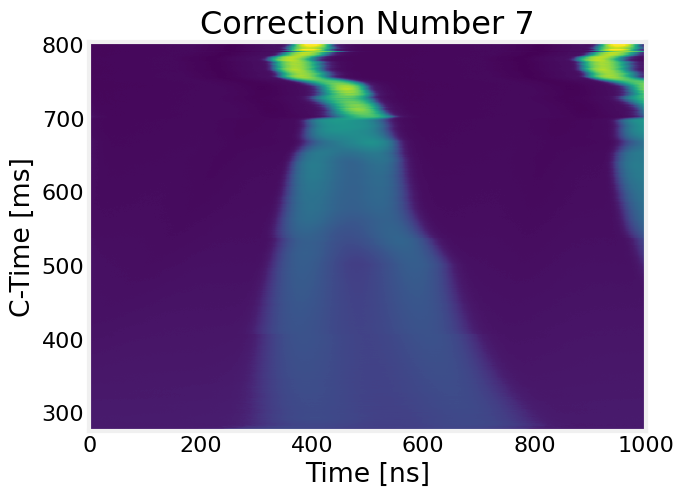

Inferring...
Trying at the following phase program


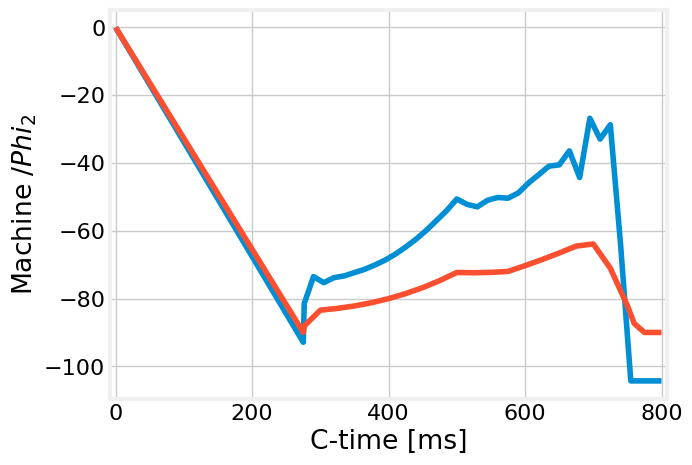

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


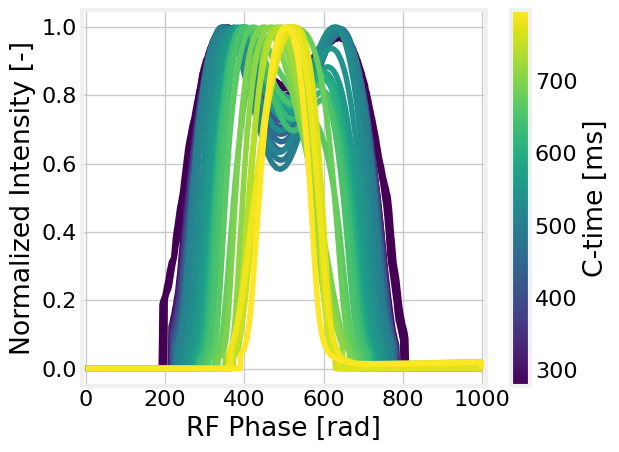

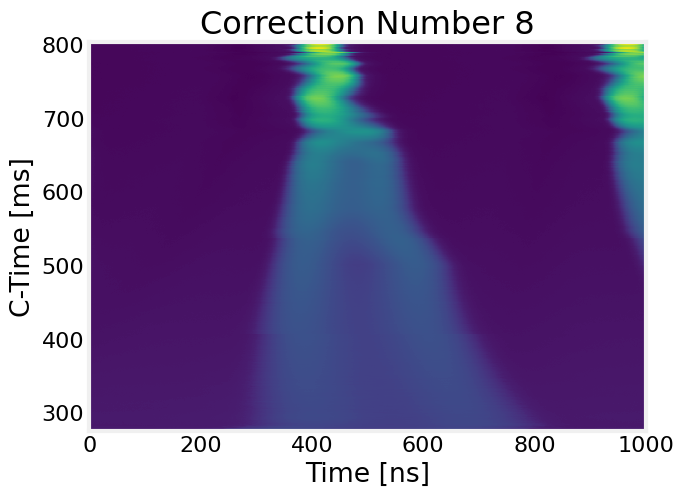

Inferring...
Trying at the following phase program


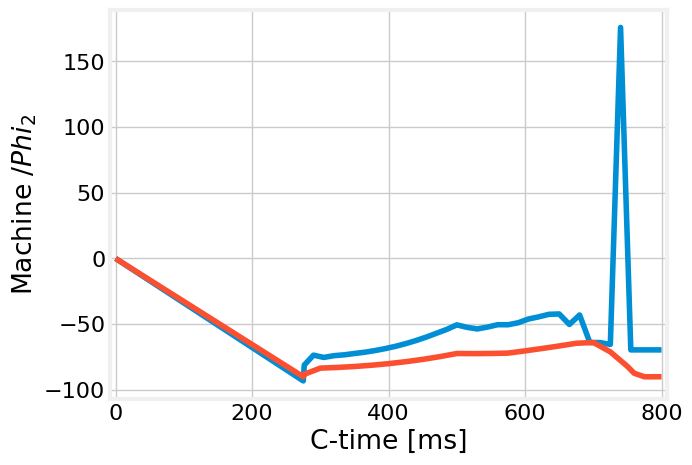

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


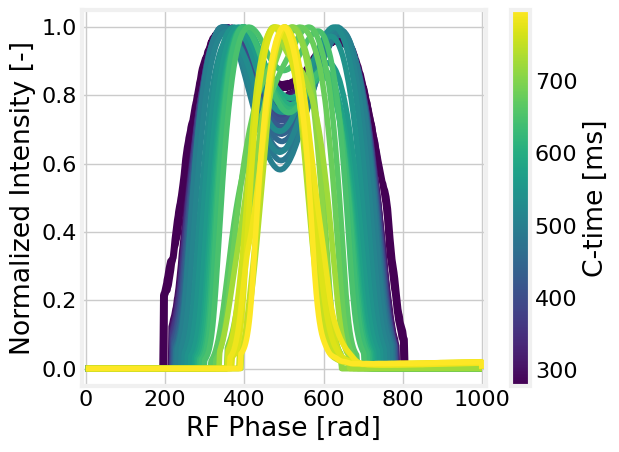

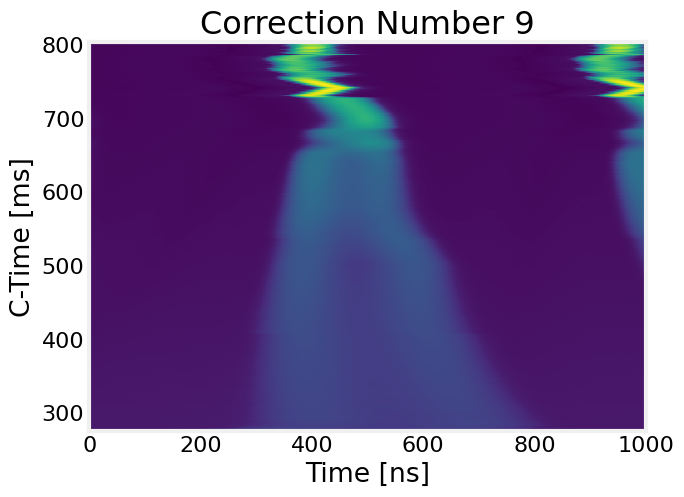

Inferring...
Trying at the following phase program


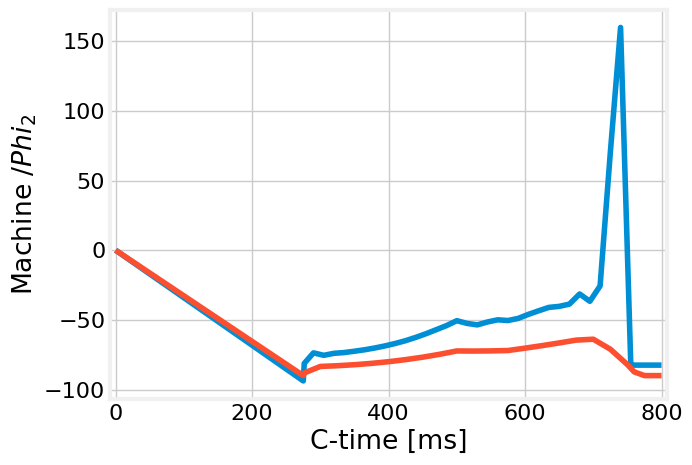

Acquiring data...
Averaging profiles on their intervals...
Re-interpolating data to RF phase...


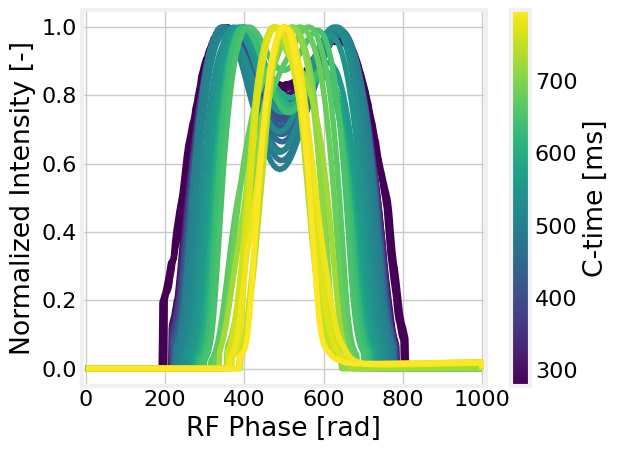

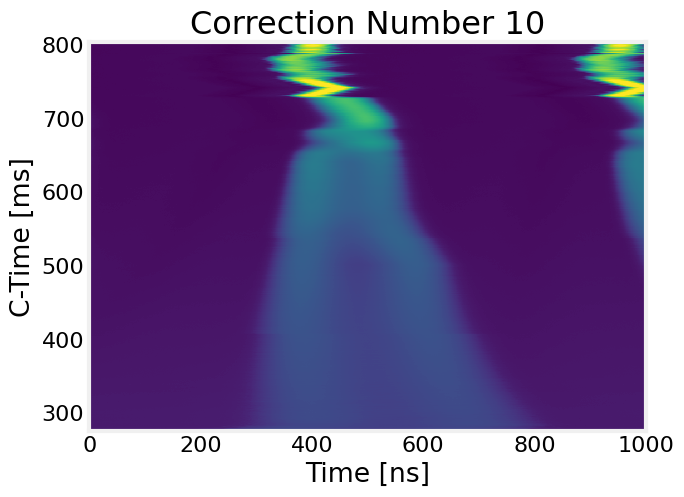

Inferring...
Trying at the following phase program


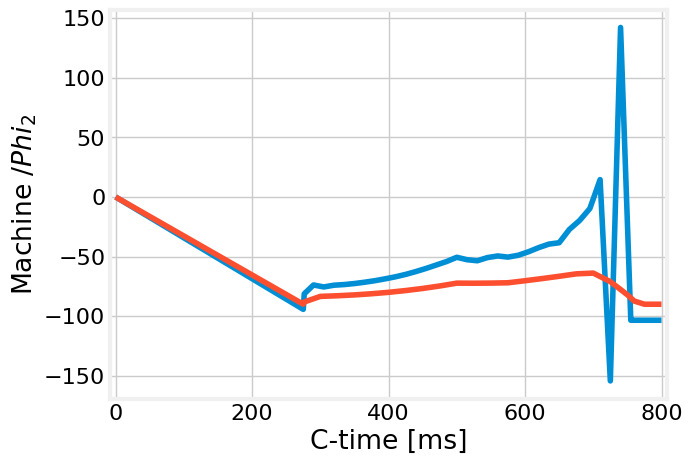

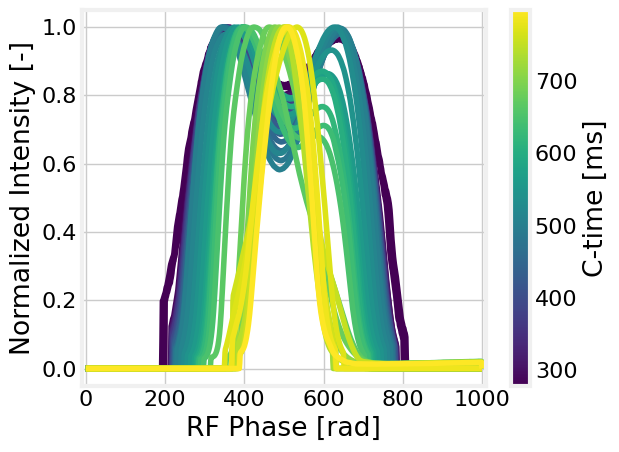

In [20]:
# Now we run a separate optimization for each entry

#THE NEXT STEPS TO BE DONE: reinterpolate the x axis from ns to phase coordinates 
# (i.e. select 1 RF period around the center, and then set the x axis to (-pi, pi), and reinterpolate profile to 1000 points)
# take the average profiles and then 


from functools import partial 
# Get the V2 phase
v2p = client.get('BA3.FGPRFH2/Settings#amplitudes', context=user_context)
v2pp = v2p.value.get('value')[0] # in ms
print(v2pp)
v2_phase_times = v2pp.xs
v2_phase_val = v2pp.ys # in deg

v2_phase = np.array([v2_phase_times, v2_phase_val])


n_calls_max = 10
results= []
prev_sol = None

model = TD3.load('best_model_rl.zip')


phase_sol = np.array([np.array(start_times),-90 + phi_s_interp*180/np.pi])

t_vals , phase_sol_val = phase_sol[0],phase_sol[1]

# new_times, new_phase_val = insert_times(phase_arr,t_vals)
# time_response = client.set('BA3.FGPRFH2/Settings', context=user_context, value = 
#                            {'amplitudes': pyda.data.DiscreteFunction(t_vals,phase_sol_val)})

# optimize_cycle(phase_sol, n_calls_max, model, client, sys_interface, bursts, burst_dict)

# NOTES: There is likely a problem with the CNN acquisition function, it always returns the same thing

phase_times, phase_vals , corrections_list = optimize_cycle(phase_sol, n_calls_max, model, client, sys_int, bursts, burst_dict,phi_s_interp)


                                      



In [151]:
data , acq_times , data_per_burst, times_per_burst = get_acq_waiting_cnn(sys_int, None, tester= False)


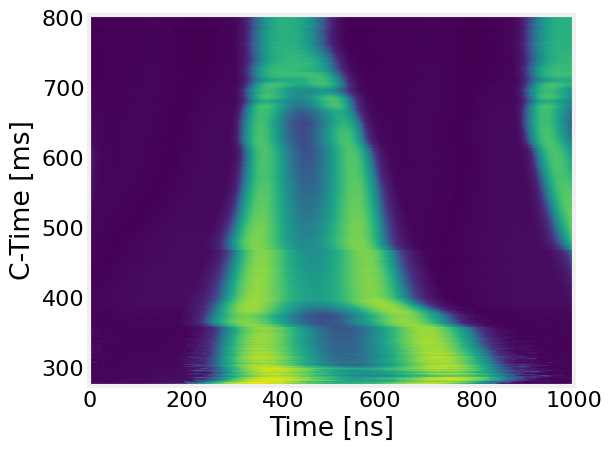

1353


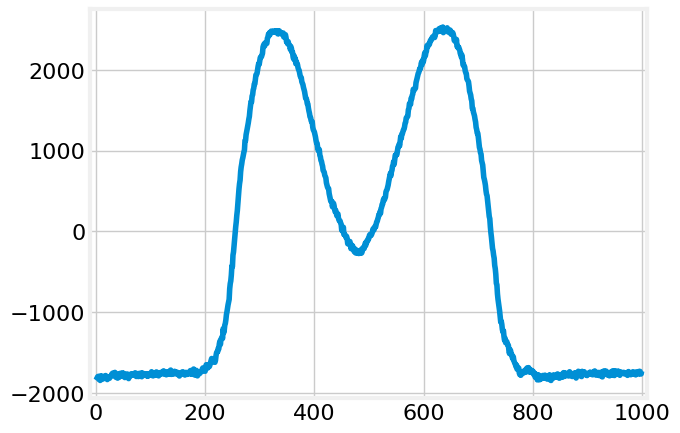

In [154]:
c1 = 380
ind = np.argmin(np.abs(acq_times-c1))
profile_des = data[ind]
acq_time = acq_times[ind]


fig=plt.figure()
ax = fig.add_subplot(111)
p = ax.pcolormesh(np.linspace(0,1000,1000),acq_times,[ (profile-np.min(profile))/np.max(profile) for profile in data], cmap='viridis', linewidth=0,antialiased=False)
plt.ylabel('C-Time [ms]')
plt.xlabel('Time [ns]')
plt.tight_layout()
plt.savefig('Final_waterfall_NORMHRS.png')
plt.show()
print(len(data)) 

plt.plot(profile_des)
plt.show()

In [24]:
data_original , acq_times , data_per_burst, times_per_burst = get_acq_waiting_cnn(sys_int, None, tester= False)


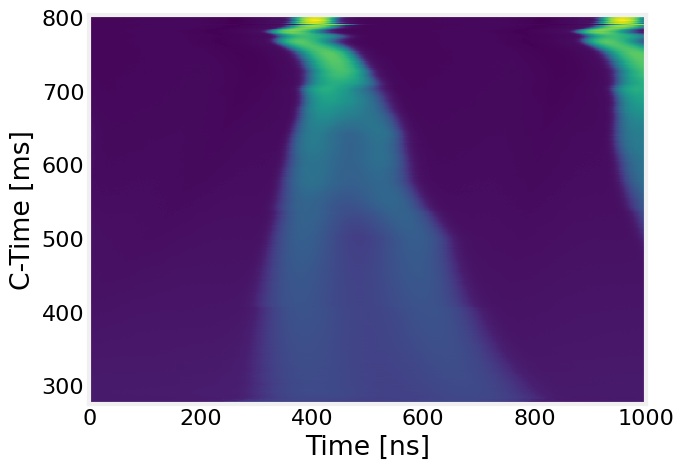

1441


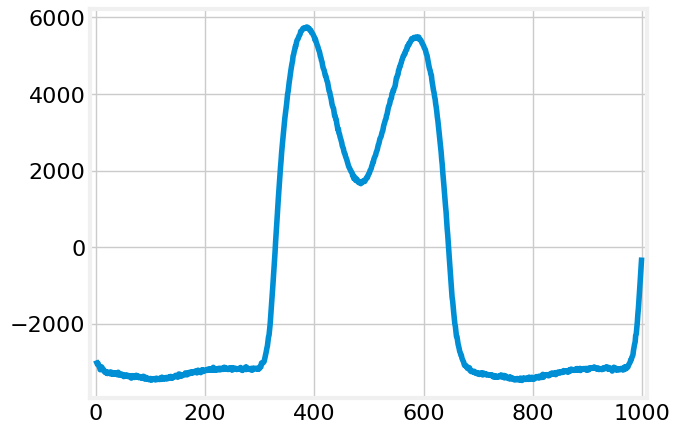

In [25]:
ind = np.argmin(np.abs(acq_times-c1))
profile_des = data_original[ind]
acq_time = acq_times[ind]



fig=plt.figure()
ax = fig.add_subplot(111)
p = ax.pcolormesh(np.linspace(0,1000,1000),acq_times,data_original, cmap='viridis', linewidth=0,antialiased=False)
plt.ylabel('C-Time [ms]')
plt.xlabel('Time [ns]')
plt.savefig('Manual_NORMHRS.png')
plt.show()
print(len(data)) 

plt.plot(profile_des)
plt.show()

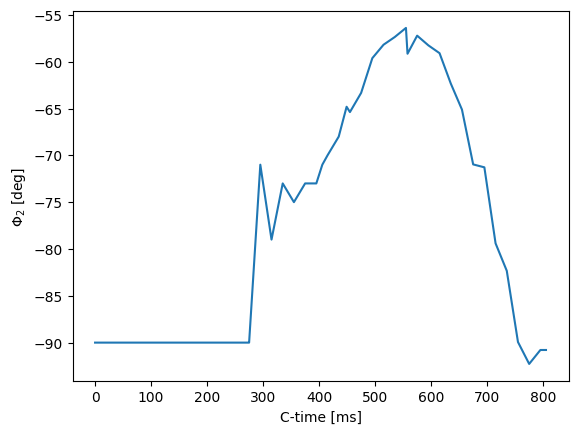

[  0.         274.         275.         275.6        277.
 280.         286.         295.         300.         315.
 335.         350.         355.         375.         395.
 400.         405.71380109 415.         435.         440.
 449.05229121 455.         475.         495.         515.
 525.         535.         555.         557.8084518  575.
 595.         615.         625.         635.         655.
 675.         695.         715.         725.         735.
 750.         755.         770.         775.         795.
 805.        ] [-90.         -90.         -90.         -89.43       -88.1
 -85.25       -79.55       -71.         -73.         -79.
 -73.         -74.5        -75.         -73.         -73.
 -72.06662445 -71.         -70.         -68.         -66.86603236
 -64.8130313  -65.38151421 -63.33262125 -59.62147847 -58.18816013
 -57.77802056 -57.36788098 -56.39472405 -59.15122648 -57.22061682
 -58.25547964 -59.09243678 -60.70933154 -62.32622631 -65.11578292
 -70.96923287 -71.281457

In [81]:
phase_vals_obj = comp_phase_array(np.array([phase_times, phase_vals]) , phase_sol[0] , phase_sol[1] , i, result.x[0])

plt.plot(phase_vals_obj.xs,phase_vals_obj.ys, label='Optimized Phase')
plt.plot(v2pp.xs,v2pp.ys, label='Manually Optimized Phase')

plt.xlabel('C-time [ms]')
plt.ylabel(r'$\Phi_2$ [deg]')
plt.show()
print(phase_vals_obj.xs,phase_vals_obj.ys )